## Using SageMaker debugger to monitor autoencoder model training

This notebook will train a convolutional autoencoder model on MNIST dataset and use SageMaker debugger to monitor key metrics in realtime. An autoencoder consists of an encoder that downsamples input data and a decoder that tries to reconstruct the original input. 
![Navigate to Sagemaker Service](images/autoencoder_pic.png)

### In this notebook we will use an autoencoder with the following architecture:
```
--------------------------------------------------------------------------------
        Layer (type)                                Output Shape         Param #
================================================================================
               Input                              (1, 1, 28, 28)               0
        Activation-1  <Symbol hybridsequential0_conv0_relu_fwd>                0
        Activation-2                             (1, 32, 24, 24)               0
            Conv2D-3                             (1, 32, 24, 24)             832
         MaxPool2D-4                             (1, 32, 12, 12)               0
        Activation-5  <Symbol hybridsequential0_conv1_relu_fwd>                0
        Activation-6                               (1, 32, 8, 8)               0
            Conv2D-7                               (1, 32, 8, 8)           25632
         MaxPool2D-8                               (1, 32, 4, 4)               0
             Dense-9                                     (1, 20)           10260
       Activation-10  <Symbol hybridsequential1_dense0_relu_fwd>               0
       Activation-11                                    (1, 512)               0
            Dense-12                                    (1, 512)           10752
     HybridLambda-13                               (1, 32, 8, 8)               0
       Activation-14  <Symbol hybridsequential1_conv0_relu_fwd>                0
       Activation-15                             (1, 32, 12, 12)               0
  Conv2DTranspose-16                             (1, 32, 12, 12)           25632
     HybridLambda-17                             (1, 32, 24, 24)               0
       Activation-18  <Symbol hybridsequential1_conv1_sigmoid_fwd>             0
       Activation-19                              (1, 1, 28, 28)               0
  Conv2DTranspose-20                              (1, 1, 28, 28)             801
ConvolutionalAutoencoder-21                       (1, 1, 28, 28)               0
================================================================================
Parameters in forward computation graph, duplicate included
   Total params: 73909
   Trainable params: 73909
   Non-trainable params: 0
Shared params in forward computation graph: 0
Unique parameters in model: 73909
--------------------------------------------------------------------------------
```

The bottleneck layer forces the autoencoder to learn a compressed representation (latent variables) of the dataset. Visualizing the latent space helps to understand what the autoencoder is learning. We can check if the model is training well by checking 
- reconstructed images (autoencoder output)
- t-Distributed Stochastic Neighbor Embedding (t-SNE) of the latent variables
(https://en.wikipedia.org/wiki/T-distributed_stochastic_neighbor_embedding)

t-SNE maps high dimensional data into a 2- or 3-dimensional space. Following animation shows those emebeddings of latent variables while the training progresses. Each cluster represents a class (0-9) of the MNIST training dataset. Over time the autoencoder becomes better in separating those classes.  
<img src="images/tsne.gif" alt="drawing" width="600"/> 

### Training MXNet autoencoder model in Amazon SageMaker with debugger 
Before starting the SageMaker training job, we need to install some libraries. We will use `smdebug` library to read, filter and analyze raw tensors that are stored in Amazon S3. We install `seaborn` library that will be used later on to plot t-Distributed Stochastic Neighbor Embedding (t-SNE) of the latent variables.

In [2]:
! pip install smdebug
! pip install -U seaborn

    100% |████████████████████████████████| 163kB 7.3MB/s ta 0:00:01
    100% |████████████████████████████████| 1.3MB 9.9MB/s eta 0:00:01
  Found existing installation: protobuf 3.5.2
    Uninstalling protobuf-3.5.2:
      Successfully uninstalled protobuf-3.5.2
You are using pip version 10.0.1, however version 20.0.2 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.
    100% |████████████████████████████████| 225kB 8.7MB/s ta 0:00:01
Requirement not upgraded as not directly required: pandas>=0.22.0 in /home/ec2-user/anaconda3/envs/mxnet_p36/lib/python3.6/site-packages (from seaborn) (0.24.2)
Requirement not upgraded as not directly required: numpy>=1.13.3 in /home/ec2-user/anaconda3/envs/mxnet_p36/lib/python3.6/site-packages (from seaborn) (1.16.4)
Requirement not upgraded as not directly required: matplotlib>=2.1.2 in /home/ec2-user/anaconda3/envs/mxnet_p36/lib/python3.6/site-packages (from seaborn) (3.0.3)
Requirement not upgraded as not direc

First we define the MXNet estimator and the debugger hook configuration. The model training is implemented in the entry point script `autoencoder_mnist.py`. We will obtain tensors every 10th iteration and store them in the SageMaker default bucket.

In [3]:
import sagemaker
from sagemaker.mxnet import MXNet
from sagemaker.debugger import DebuggerHookConfig, CollectionConfig

sagemaker_session = sagemaker.Session()
BUCKET_NAME = sagemaker_session.default_bucket()
LOCATION_IN_BUCKET = 'smdebug-autoencoder-example'

s3_bucket_for_tensors = 's3://{BUCKET_NAME}/{LOCATION_IN_BUCKET}'.format(BUCKET_NAME=BUCKET_NAME, LOCATION_IN_BUCKET=LOCATION_IN_BUCKET)
estimator = MXNet(role=sagemaker.get_execution_role(),
                  base_job_name='mxnet',
                  train_instance_count=1,
                  train_instance_type='ml.m5.xlarge',
                  train_volume_size=400,
                  source_dir='src',
                  entry_point='autoencoder_mnist.py',
                  framework_version='1.6.0',
                  py_version='py3',
                  debugger_hook_config = DebuggerHookConfig(
                      s3_output_path=s3_bucket_for_tensors,  
                      collection_configs=[
                        CollectionConfig(
                            name="all",
                            parameters={
                                "include_regex": ".*convolutionalautoencoder0_hybridsequential0_dense0_output_0|.*convolutionalautoencoder0_input_1|.*loss",
                                "save_interval": "10"
                            }
                        )
                     ]
                   )
                )

Start the training job:

In [4]:
estimator.fit(wait=False)

We can check the S3 location of tensors:

In [5]:
path = estimator.latest_job_debugger_artifacts_path()
print('Tensors are stored in: {}'.format(path))

Tensors are stored in: s3://sagemaker-us-east-2-328296961357/smdebug-autoencoder-example/mxnet-2020-03-27-18-53-53-610/debug-output


Get the training job name:

In [6]:
job_name = estimator.latest_training_job.name
print('Training job name: {}'.format(job_name))

client = estimator.sagemaker_session.sagemaker_client

description = client.describe_training_job(TrainingJobName=job_name)

Training job name: mxnet-2020-03-27-18-53-53-610


We can access the tensors from S3 once the training job is in status `Training` or `Completed`. In the following code cell we check the job status.

In [7]:
import time

if description['TrainingJobStatus'] != 'Completed':
    while description['SecondaryStatus'] not in {'Training', 'Completed'}:
        description = client.describe_training_job(TrainingJobName=job_name)
        primary_status = description['TrainingJobStatus']
        secondary_status = description['SecondaryStatus']
        print('Current job status: [PrimaryStatus: {}, SecondaryStatus: {}]'.format(primary_status, secondary_status))
        time.sleep(15)

Current job status: [PrimaryStatus: InProgress, SecondaryStatus: Starting]
Current job status: [PrimaryStatus: InProgress, SecondaryStatus: Starting]
Current job status: [PrimaryStatus: InProgress, SecondaryStatus: Starting]
Current job status: [PrimaryStatus: InProgress, SecondaryStatus: Starting]
Current job status: [PrimaryStatus: InProgress, SecondaryStatus: Starting]
Current job status: [PrimaryStatus: InProgress, SecondaryStatus: Starting]
Current job status: [PrimaryStatus: InProgress, SecondaryStatus: Starting]
Current job status: [PrimaryStatus: InProgress, SecondaryStatus: Starting]
Current job status: [PrimaryStatus: InProgress, SecondaryStatus: Starting]
Current job status: [PrimaryStatus: InProgress, SecondaryStatus: Starting]
Current job status: [PrimaryStatus: InProgress, SecondaryStatus: Downloading]
Current job status: [PrimaryStatus: InProgress, SecondaryStatus: Training]


### Get tensors and visualize model training in real-time

In this section, we will retrieve the tensors from the bottlneck layer and input/output tensors while the model is still training. Once we have the tensors, we will compute t-SNE and plot the results.

Helper function to compute stochastic neighbor embeddings:

In [8]:
from sklearn.manifold import TSNE

def compute_tsne(tensors, labels):
    
    #compute TSNE
    tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
    tsne_results = tsne.fit_transform(tensors)
    
    #add results to dictionary
    data = {}
    data["x"] = tsne_results[:,0]
    data["y"] = tsne_results[:,1]
    data["z"] = labels
    
    return data

Helper function to plot t-SNE results and autoencoder input/output.

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns
    
def plot_autoencoder_data(tsne_results, input_tensor, output_tensor):
    fig, (ax0, ax1, ax2) = plt.subplots(ncols=3, figsize=(30, 15), gridspec_kw={'width_ratios': [1,1,3]})
    plt.rcParams.update({'font.size': 20})
    ax0.imshow(input_tensor, cmap=plt.cm.gray)
    ax1.imshow(output_tensor, cmap=plt.cm.gray)
    ax0.set_axis_off()
    ax1.set_axis_off()
    ax2.set_axis_off()
    ax0.set_title('autoencoder input')
    ax1.set_title('autoencoder output')
    plt.title("Step " + str(step))
    sns.scatterplot(x="x", y="y", hue="z", data=tsne_results, palette="viridis", legend="full", s=100)
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    plt.axis('off')
    plt.show()
    plt.clf()

Create trial: 

In [10]:
from smdebug.trials import create_trial

trial = create_trial(estimator.latest_job_debugger_artifacts_path())

[2020-03-27 18:56:56.840 ip-10-10-41-69:24605 INFO s3_trial.py:42] Loading trial debug-output at path s3://sagemaker-us-east-2-328296961357/smdebug-autoencoder-example/mxnet-2020-03-27-18-53-53-610/debug-output


Get available steps

In [11]:
steps = 0
while steps == 0:
    steps = trial.steps()
    print('Waiting for tensors to become available...')
    time.sleep(3)
print('\nDone')

print('Getting tensors...')
rendered_steps = []

Waiting for tensors to become available...

Done
Getting tensors...


To determine how well the autoencoder is training, we will get the following tensors:
- **Dense layer:** we will compute the t-distributed stochastic neighbor embeddings (t-SNE) of the tensors retrieved from the bottleneck layer.
- **Input label:** will be used to mark the embeddigns. Emebeddings with the same label should be in the same clsuter. 
- **Autoencoder input and output:** to determine the reconstruction performance of the autoencoder.

In [12]:
label_input = 'convolutionalautoencoder0_input_1'
autoencoder_bottleneck = 'convolutionalautoencoder0_hybridsequential0_dense0_output_0'
autoencoder_input = 'l2loss0_input_1'
autoencoder_output = 'l2loss0_input_0'

Following code cell iterates over available steps, retrieves the tensors and computes t-SNE. 

[t-SNE] Computing 99 nearest neighbors...
[t-SNE] Indexed 100 samples in 0.000s...
[t-SNE] Computed neighbors for 100 samples in 0.003s...
[t-SNE] Computed conditional probabilities for sample 100 / 100
[t-SNE] Mean sigma: 8.620390
[t-SNE] KL divergence after 250 iterations with early exaggeration: 51.912956
[t-SNE] KL divergence after 300 iterations: 0.603437


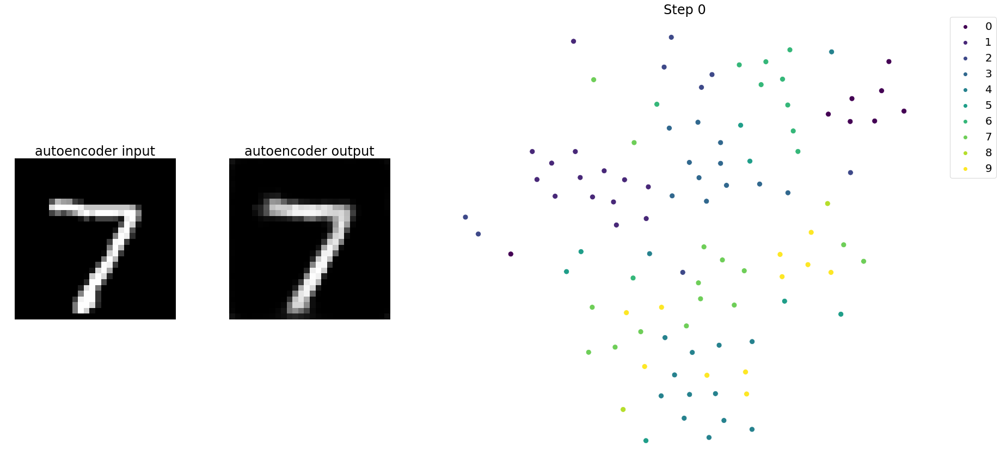

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 200 samples in 0.000s...
[t-SNE] Computed neighbors for 200 samples in 0.003s...
[t-SNE] Computed conditional probabilities for sample 200 / 200
[t-SNE] Mean sigma: 6.819139
[t-SNE] KL divergence after 250 iterations with early exaggeration: 57.644398
[t-SNE] KL divergence after 300 iterations: 0.693784


<Figure size 432x288 with 0 Axes>

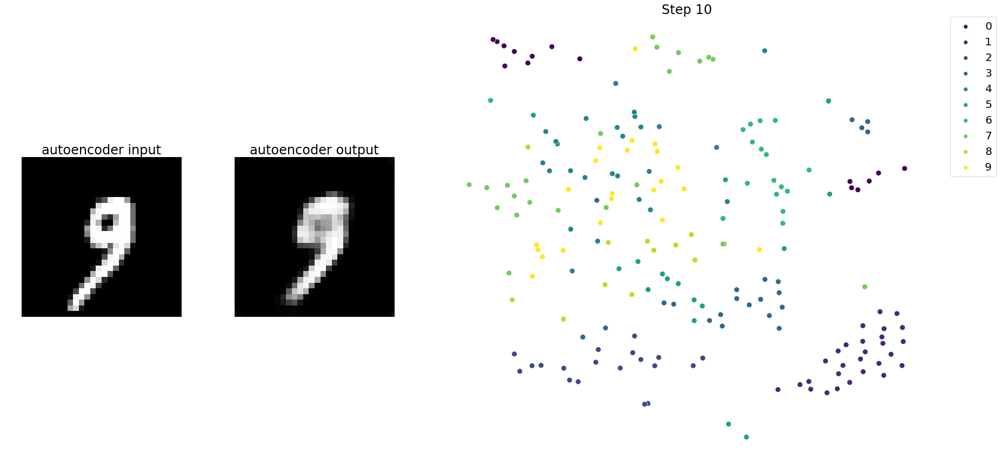

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 300 samples in 0.002s...
[t-SNE] Computed neighbors for 300 samples in 0.009s...
[t-SNE] Computed conditional probabilities for sample 300 / 300
[t-SNE] Mean sigma: 5.846150
[t-SNE] KL divergence after 250 iterations with early exaggeration: 61.037346
[t-SNE] KL divergence after 300 iterations: 0.809922


<Figure size 432x288 with 0 Axes>

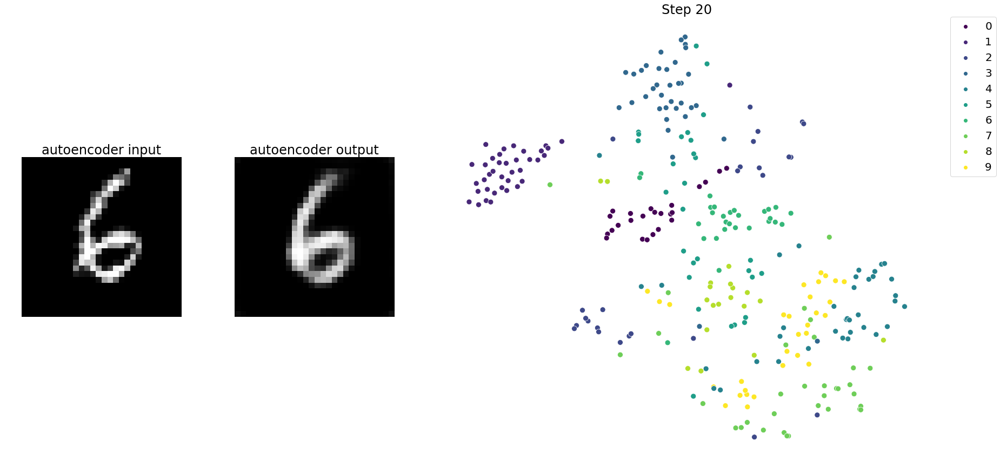

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.001s...
[t-SNE] Computed neighbors for 400 samples in 0.014s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 5.590015
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.431114
[t-SNE] KL divergence after 300 iterations: 0.744726


<Figure size 432x288 with 0 Axes>

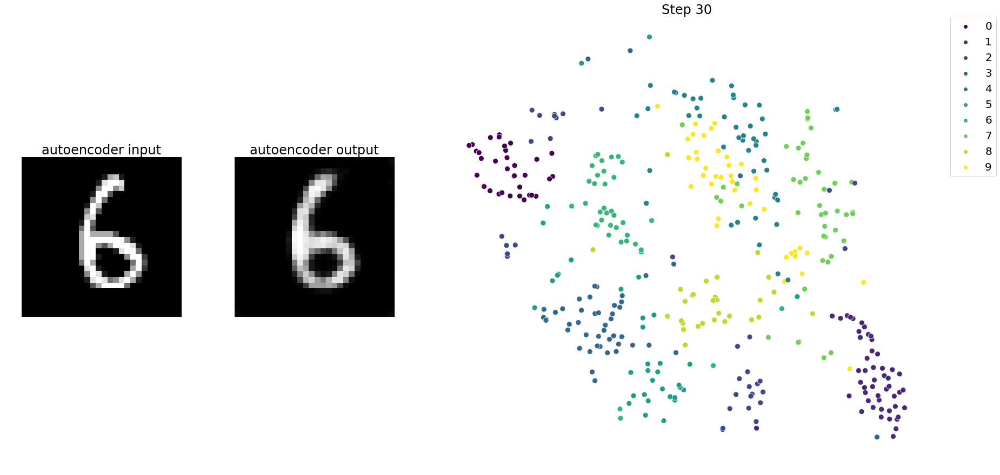

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 500 samples in 0.001s...
[t-SNE] Computed neighbors for 500 samples in 0.021s...
[t-SNE] Computed conditional probabilities for sample 500 / 500
[t-SNE] Mean sigma: 5.179630
[t-SNE] KL divergence after 250 iterations with early exaggeration: 64.811615
[t-SNE] KL divergence after 300 iterations: 0.831285


<Figure size 432x288 with 0 Axes>

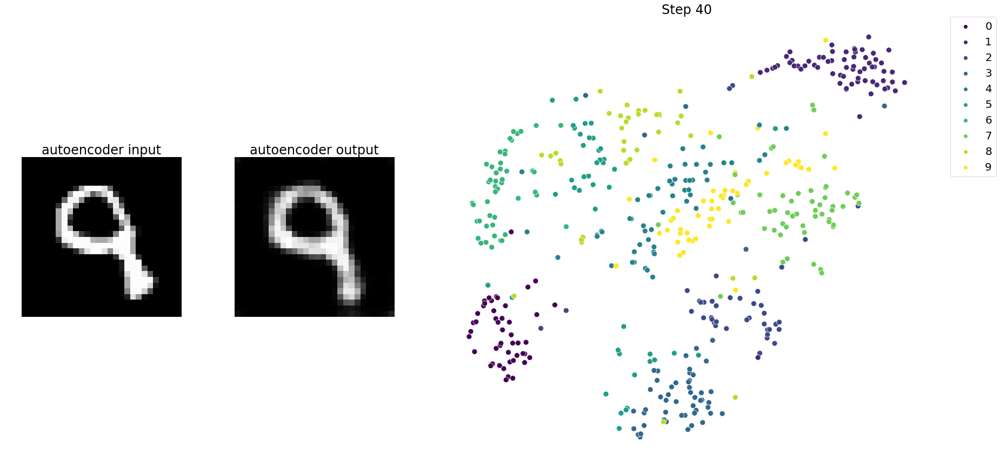

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 600 samples in 0.000s...
[t-SNE] Computed neighbors for 600 samples in 0.027s...
[t-SNE] Computed conditional probabilities for sample 600 / 600
[t-SNE] Mean sigma: 5.270931
[t-SNE] KL divergence after 250 iterations with early exaggeration: 64.708199
[t-SNE] KL divergence after 300 iterations: 0.820204


<Figure size 432x288 with 0 Axes>

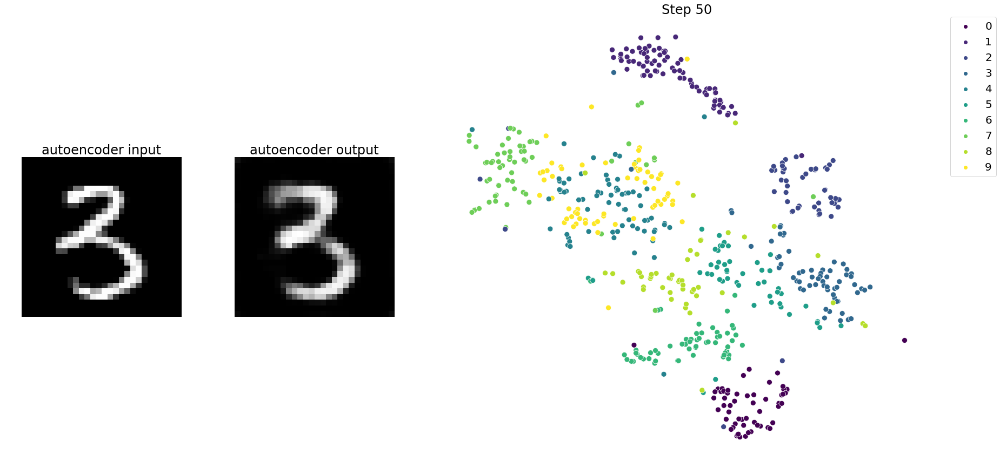

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 700 samples in 0.001s...
[t-SNE] Computed neighbors for 700 samples in 0.033s...
[t-SNE] Computed conditional probabilities for sample 700 / 700
[t-SNE] Mean sigma: 5.218022
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.003113
[t-SNE] KL divergence after 300 iterations: 0.883262


<Figure size 432x288 with 0 Axes>

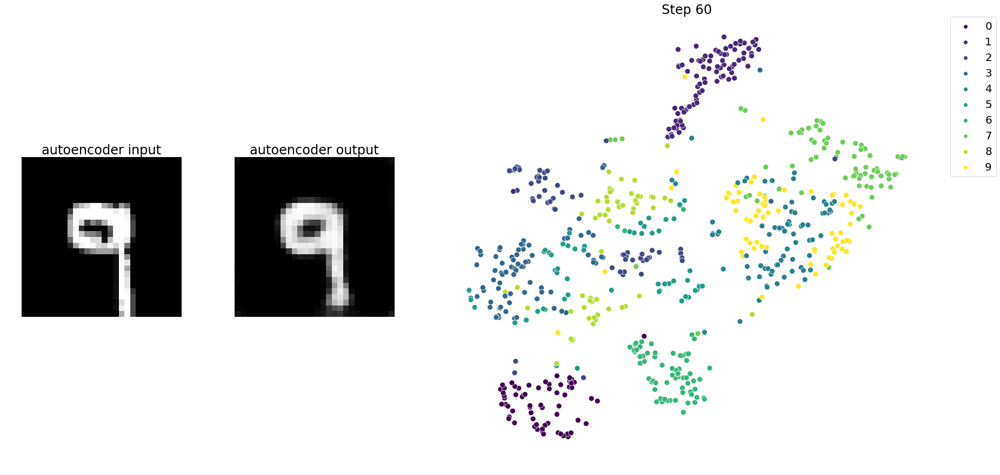

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 800 samples in 0.001s...
[t-SNE] Computed neighbors for 800 samples in 0.041s...
[t-SNE] Computed conditional probabilities for sample 800 / 800
[t-SNE] Mean sigma: 5.086619
[t-SNE] KL divergence after 250 iterations with early exaggeration: 64.218239
[t-SNE] KL divergence after 300 iterations: 0.874074


<Figure size 432x288 with 0 Axes>

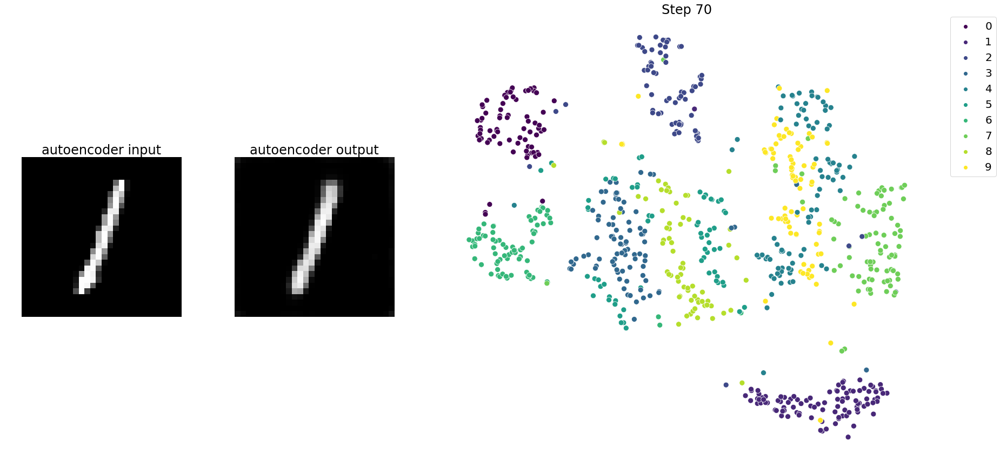

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 900 samples in 0.001s...
[t-SNE] Computed neighbors for 900 samples in 0.049s...
[t-SNE] Computed conditional probabilities for sample 900 / 900
[t-SNE] Mean sigma: 5.007682
[t-SNE] KL divergence after 250 iterations with early exaggeration: 64.622002
[t-SNE] KL divergence after 300 iterations: 0.909369


<Figure size 432x288 with 0 Axes>

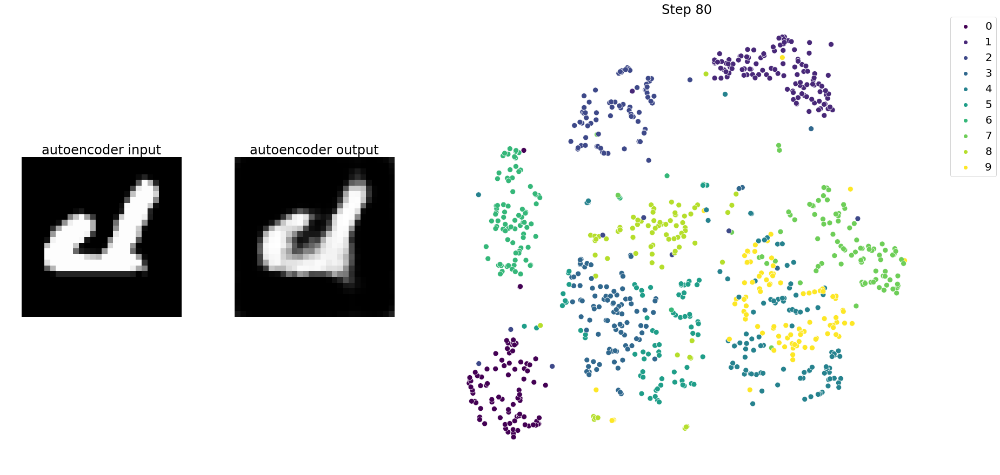

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.001s...
[t-SNE] Computed neighbors for 1000 samples in 0.067s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 4.977381
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.466263
[t-SNE] KL divergence after 300 iterations: 0.948580


<Figure size 432x288 with 0 Axes>

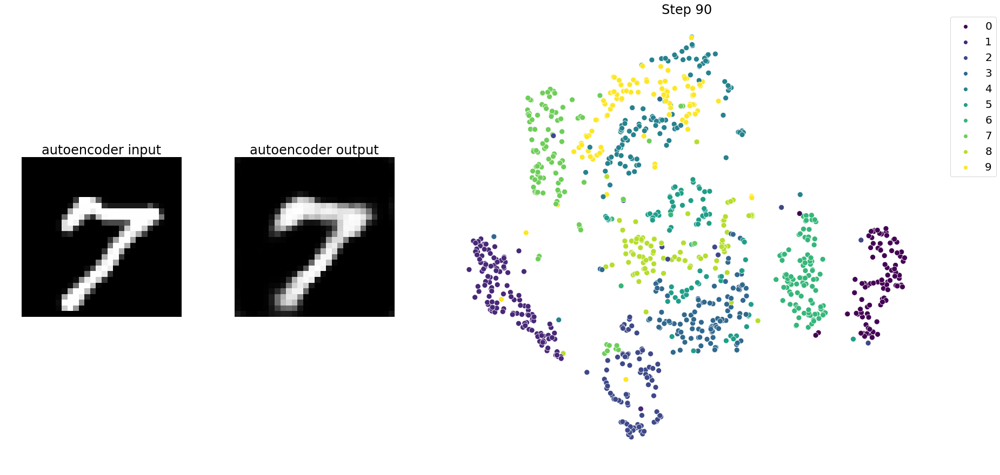

[t-SNE] Computing 99 nearest neighbors...
[t-SNE] Indexed 100 samples in 0.000s...
[t-SNE] Computed neighbors for 100 samples in 0.005s...
[t-SNE] Computed conditional probabilities for sample 100 / 100
[t-SNE] Mean sigma: 5.538421
[t-SNE] KL divergence after 250 iterations with early exaggeration: 55.155285
[t-SNE] KL divergence after 300 iterations: 0.881422


<Figure size 432x288 with 0 Axes>

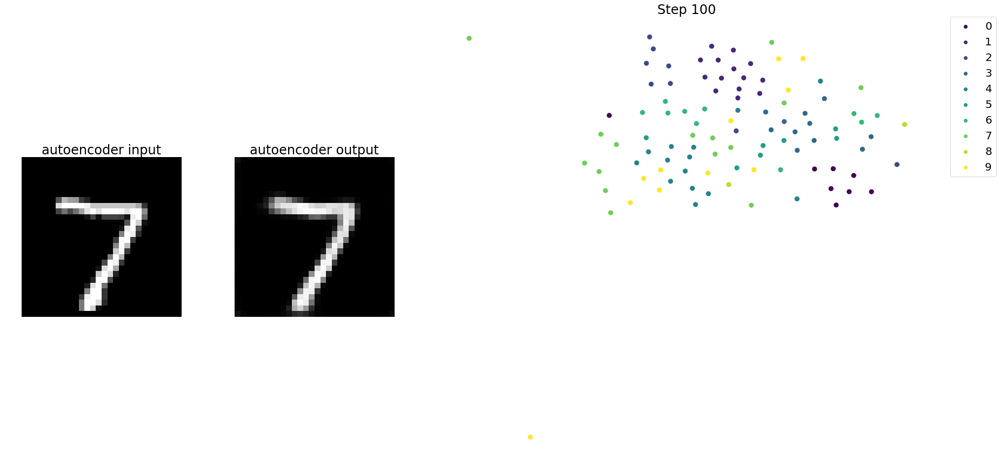

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 200 samples in 0.000s...
[t-SNE] Computed neighbors for 200 samples in 0.003s...
[t-SNE] Computed conditional probabilities for sample 200 / 200
[t-SNE] Mean sigma: 5.733118
[t-SNE] KL divergence after 250 iterations with early exaggeration: 58.425232
[t-SNE] KL divergence after 300 iterations: 0.672673


<Figure size 432x288 with 0 Axes>

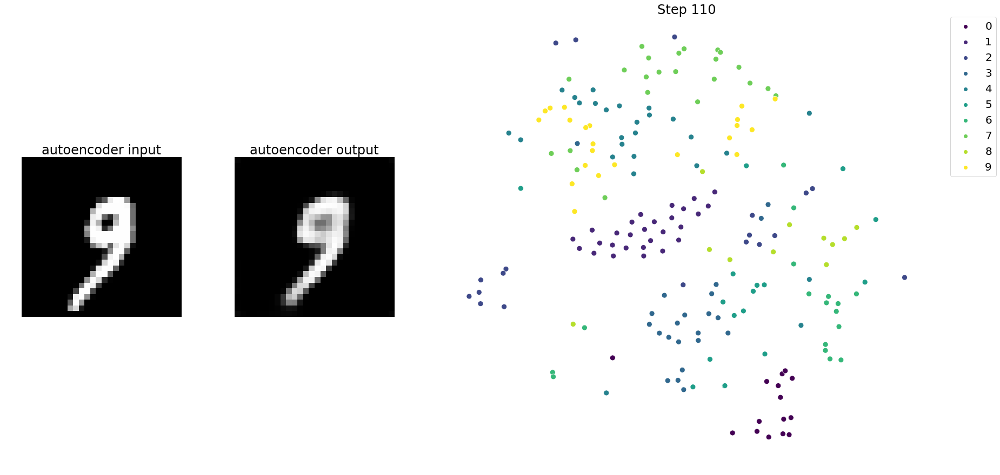

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 300 samples in 0.001s...
[t-SNE] Computed neighbors for 300 samples in 0.009s...
[t-SNE] Computed conditional probabilities for sample 300 / 300
[t-SNE] Mean sigma: 5.141327
[t-SNE] KL divergence after 250 iterations with early exaggeration: 61.038124
[t-SNE] KL divergence after 300 iterations: 0.935676


<Figure size 432x288 with 0 Axes>

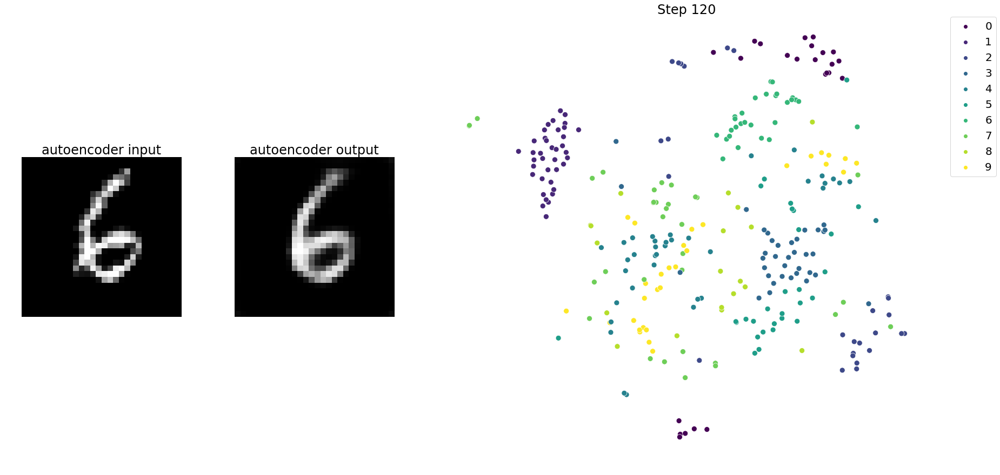

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.001s...
[t-SNE] Computed neighbors for 400 samples in 0.014s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 5.497330
[t-SNE] KL divergence after 250 iterations with early exaggeration: 63.189701
[t-SNE] KL divergence after 300 iterations: 0.928585


<Figure size 432x288 with 0 Axes>

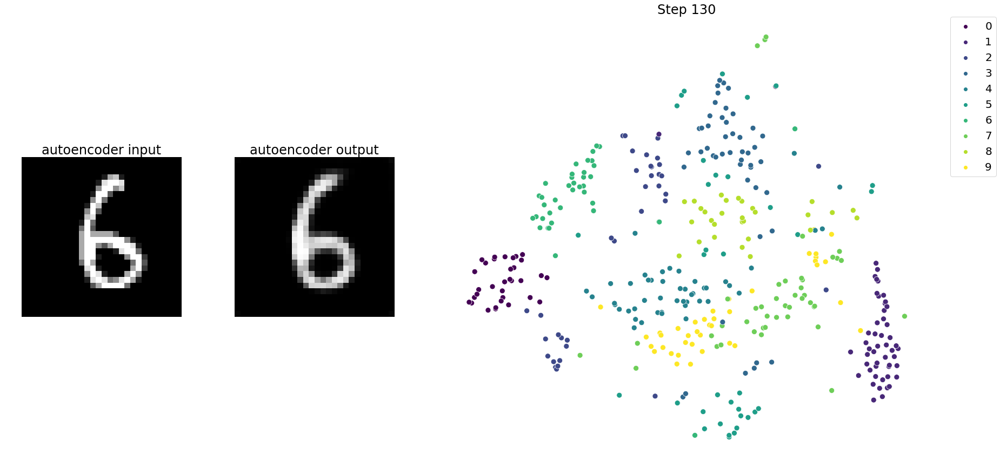

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 500 samples in 0.001s...
[t-SNE] Computed neighbors for 500 samples in 0.021s...
[t-SNE] Computed conditional probabilities for sample 500 / 500
[t-SNE] Mean sigma: 5.282119
[t-SNE] KL divergence after 250 iterations with early exaggeration: 66.713020
[t-SNE] KL divergence after 300 iterations: 0.782888


<Figure size 432x288 with 0 Axes>

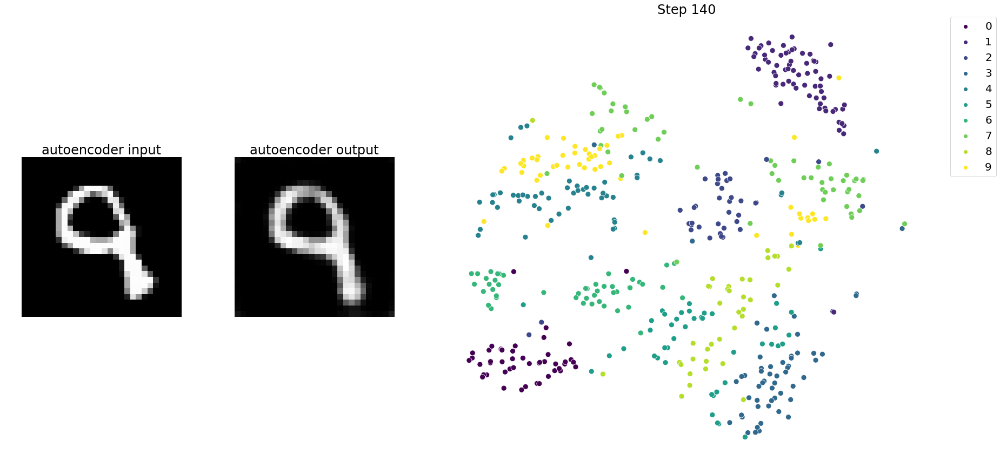

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 600 samples in 0.001s...
[t-SNE] Computed neighbors for 600 samples in 0.027s...
[t-SNE] Computed conditional probabilities for sample 600 / 600
[t-SNE] Mean sigma: 5.264430
[t-SNE] KL divergence after 250 iterations with early exaggeration: 64.782722
[t-SNE] KL divergence after 300 iterations: 0.803934


<Figure size 432x288 with 0 Axes>

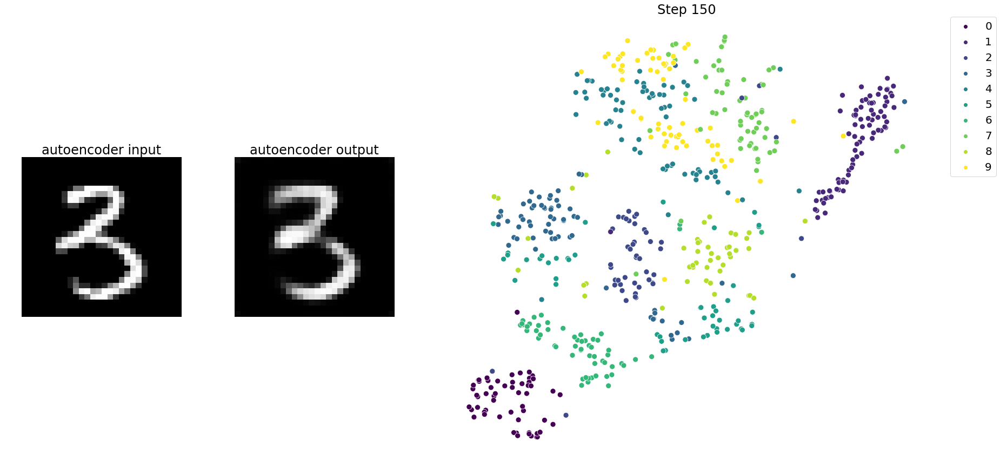

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 700 samples in 0.001s...
[t-SNE] Computed neighbors for 700 samples in 0.033s...
[t-SNE] Computed conditional probabilities for sample 700 / 700
[t-SNE] Mean sigma: 5.145944
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.554260
[t-SNE] KL divergence after 300 iterations: 0.882658


<Figure size 432x288 with 0 Axes>

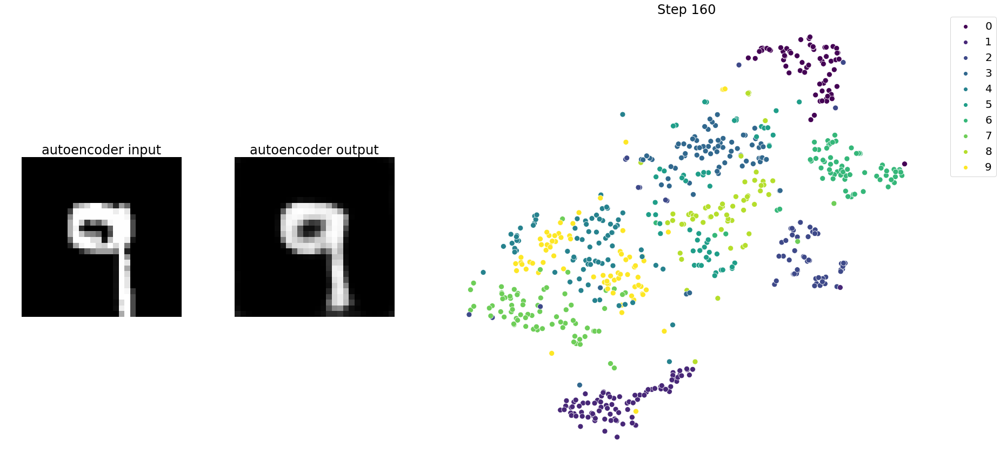

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 800 samples in 0.001s...
[t-SNE] Computed neighbors for 800 samples in 0.040s...
[t-SNE] Computed conditional probabilities for sample 800 / 800
[t-SNE] Mean sigma: 5.049466
[t-SNE] KL divergence after 250 iterations with early exaggeration: 64.324928
[t-SNE] KL divergence after 300 iterations: 0.881177


<Figure size 432x288 with 0 Axes>

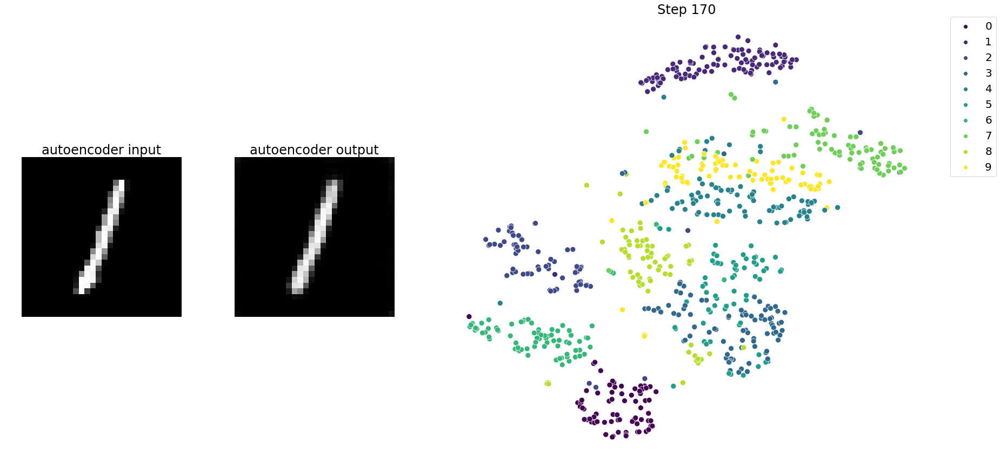

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 900 samples in 0.001s...
[t-SNE] Computed neighbors for 900 samples in 0.048s...
[t-SNE] Computed conditional probabilities for sample 900 / 900
[t-SNE] Mean sigma: 4.995879
[t-SNE] KL divergence after 250 iterations with early exaggeration: 64.766319
[t-SNE] KL divergence after 300 iterations: 0.920613


<Figure size 432x288 with 0 Axes>

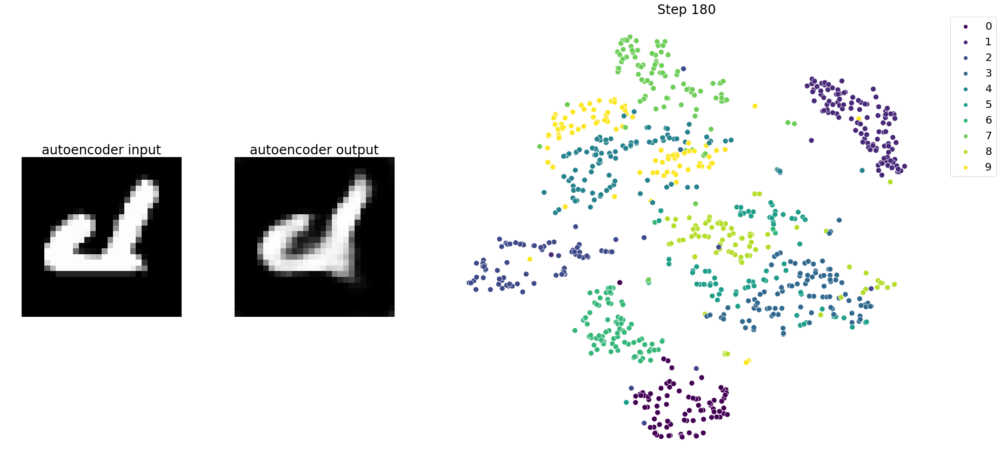

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.001s...
[t-SNE] Computed neighbors for 1000 samples in 0.066s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 4.989402
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.711082
[t-SNE] KL divergence after 300 iterations: 0.935499


<Figure size 432x288 with 0 Axes>

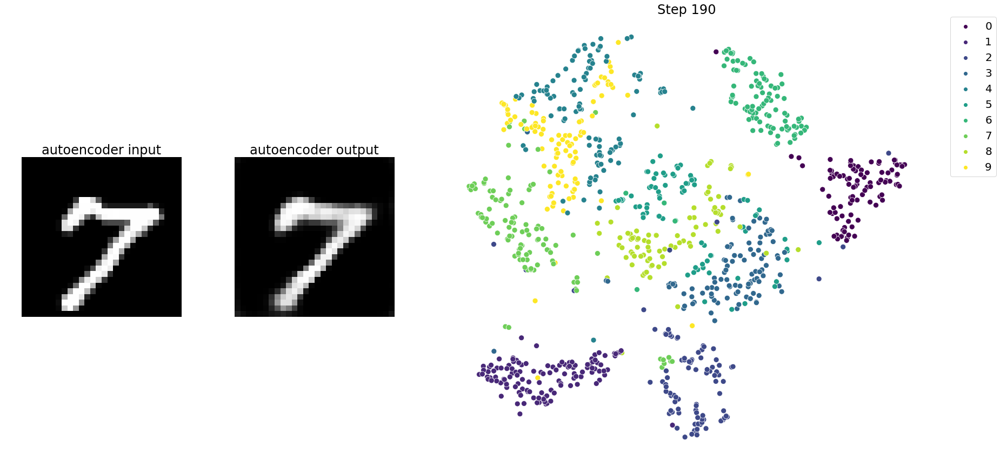

[t-SNE] Computing 99 nearest neighbors...
[t-SNE] Indexed 100 samples in 0.000s...
[t-SNE] Computed neighbors for 100 samples in 0.005s...
[t-SNE] Computed conditional probabilities for sample 100 / 100
[t-SNE] Mean sigma: 8.862660
[t-SNE] KL divergence after 250 iterations with early exaggeration: 51.327259
[t-SNE] KL divergence after 300 iterations: 0.590961


<Figure size 432x288 with 0 Axes>

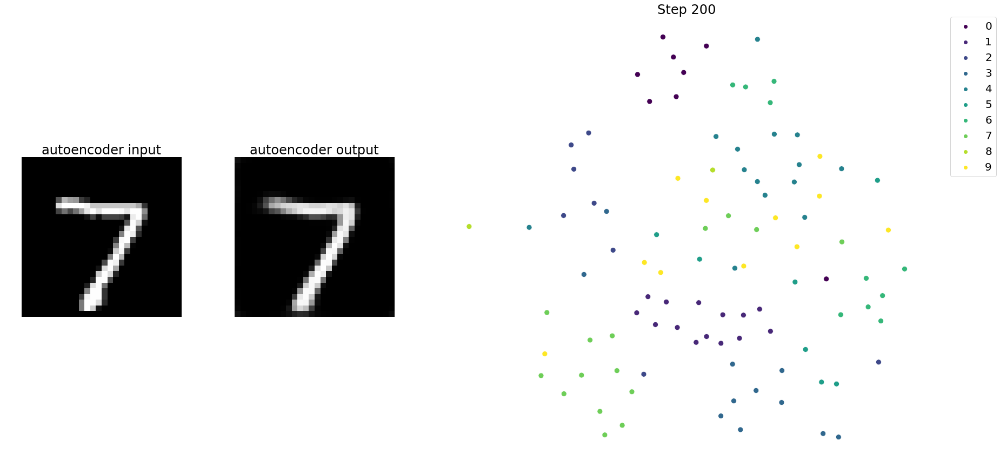

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 200 samples in 0.000s...
[t-SNE] Computed neighbors for 200 samples in 0.003s...
[t-SNE] Computed conditional probabilities for sample 200 / 200
[t-SNE] Mean sigma: 5.723507
[t-SNE] KL divergence after 250 iterations with early exaggeration: 58.934067
[t-SNE] KL divergence after 300 iterations: 0.718369


<Figure size 432x288 with 0 Axes>

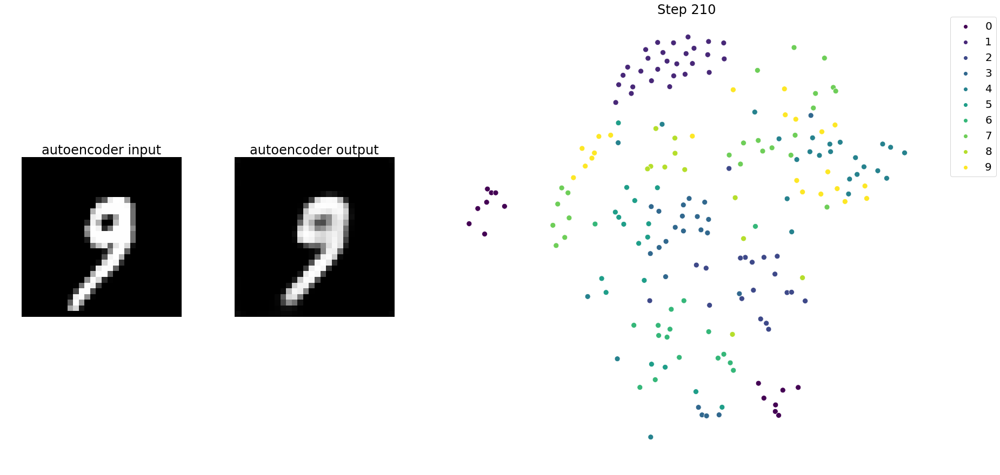

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 300 samples in 0.001s...
[t-SNE] Computed neighbors for 300 samples in 0.010s...
[t-SNE] Computed conditional probabilities for sample 300 / 300
[t-SNE] Mean sigma: 5.651865
[t-SNE] KL divergence after 250 iterations with early exaggeration: 62.247005
[t-SNE] KL divergence after 300 iterations: 0.797739


<Figure size 432x288 with 0 Axes>

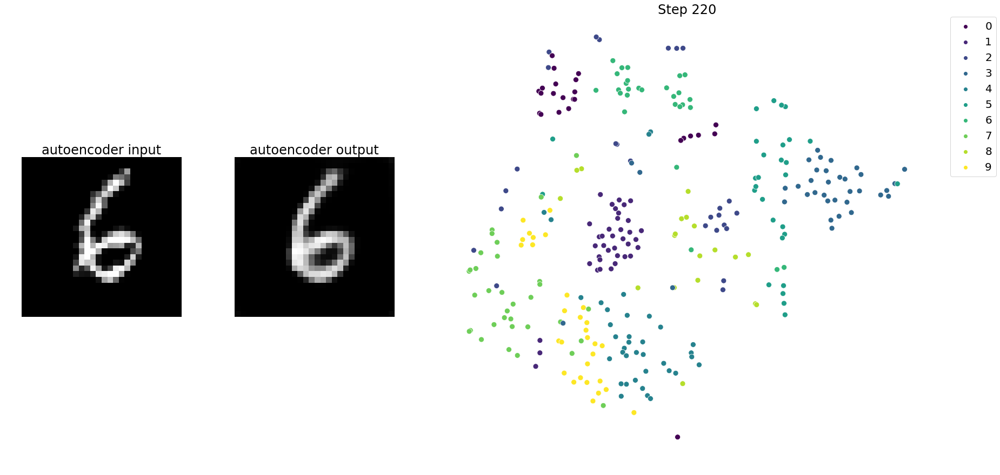

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.001s...
[t-SNE] Computed neighbors for 400 samples in 0.014s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 5.703052
[t-SNE] KL divergence after 250 iterations with early exaggeration: 63.592678
[t-SNE] KL divergence after 300 iterations: 0.828163


<Figure size 432x288 with 0 Axes>

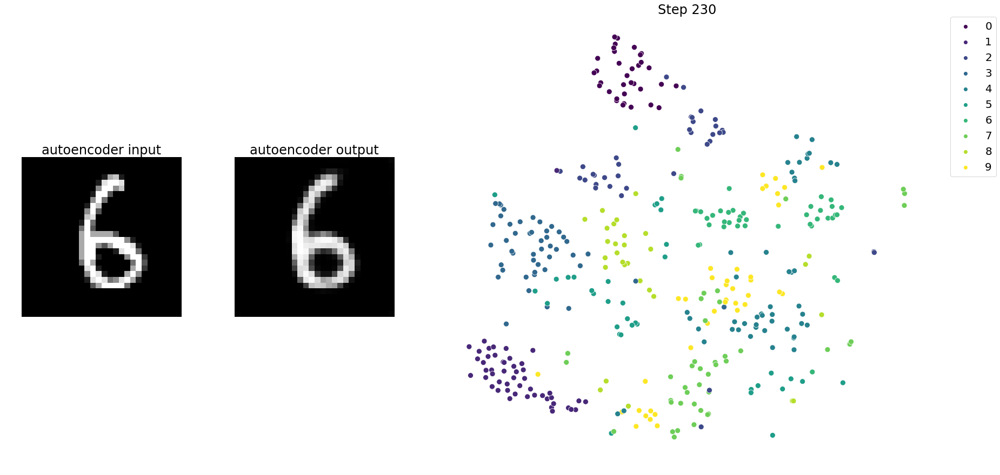

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 500 samples in 0.001s...
[t-SNE] Computed neighbors for 500 samples in 0.021s...
[t-SNE] Computed conditional probabilities for sample 500 / 500
[t-SNE] Mean sigma: 5.573080
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.393669
[t-SNE] KL divergence after 300 iterations: 0.733856


<Figure size 432x288 with 0 Axes>

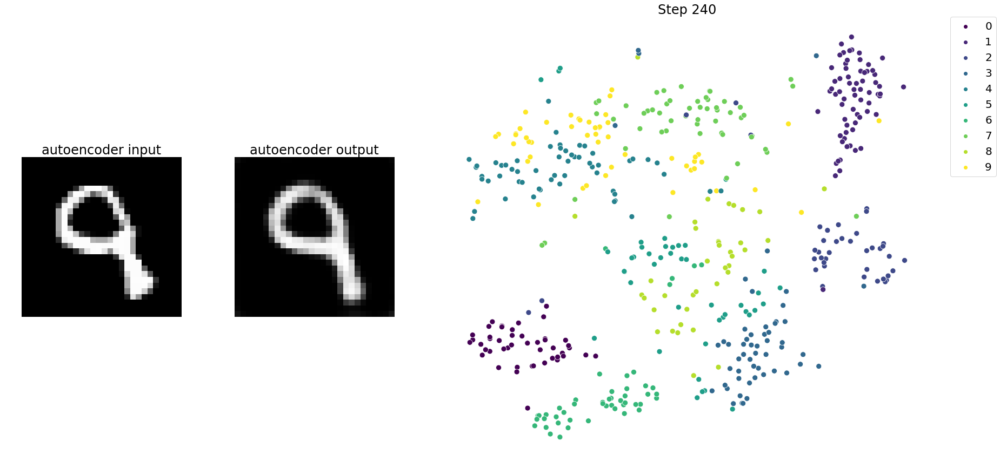

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 600 samples in 0.001s...
[t-SNE] Computed neighbors for 600 samples in 0.028s...
[t-SNE] Computed conditional probabilities for sample 600 / 600
[t-SNE] Mean sigma: 5.498226
[t-SNE] KL divergence after 250 iterations with early exaggeration: 64.578491
[t-SNE] KL divergence after 300 iterations: 0.841900


<Figure size 432x288 with 0 Axes>

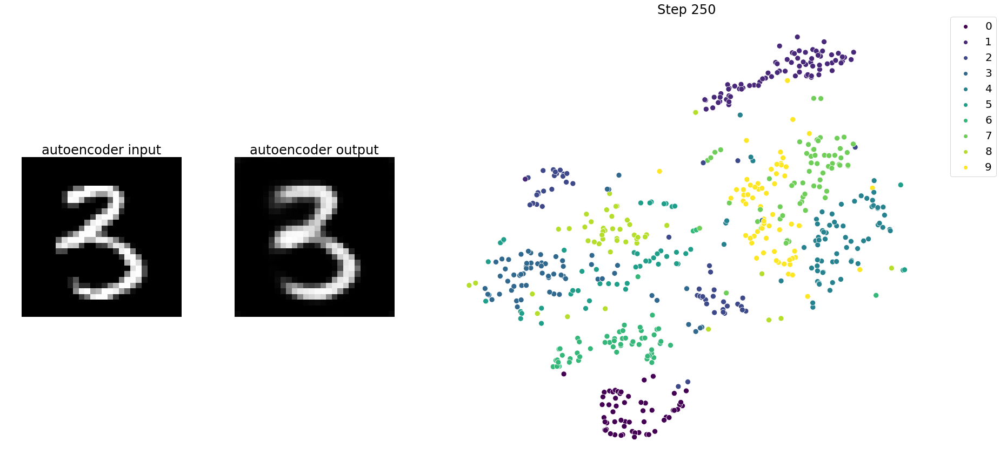

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 700 samples in 0.001s...
[t-SNE] Computed neighbors for 700 samples in 0.036s...
[t-SNE] Computed conditional probabilities for sample 700 / 700
[t-SNE] Mean sigma: 5.432421
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.451614
[t-SNE] KL divergence after 300 iterations: 0.868312


<Figure size 432x288 with 0 Axes>

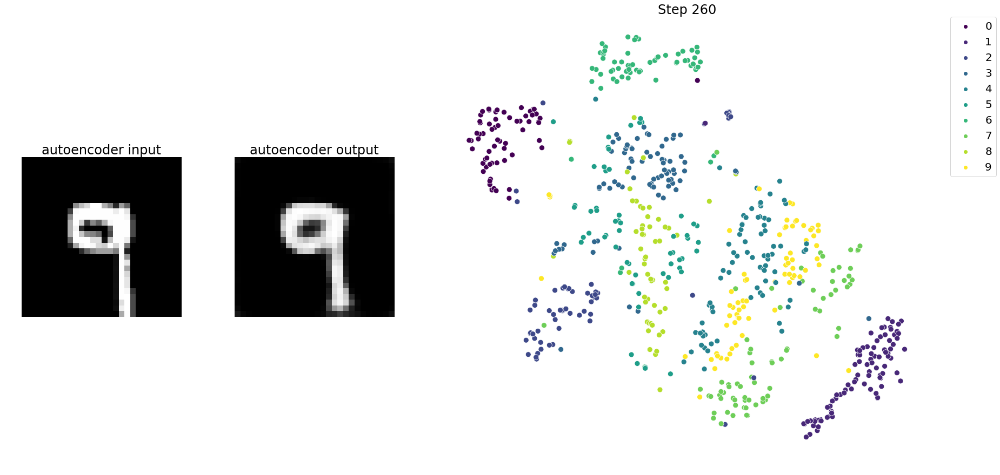

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 800 samples in 0.001s...
[t-SNE] Computed neighbors for 800 samples in 0.040s...
[t-SNE] Computed conditional probabilities for sample 800 / 800
[t-SNE] Mean sigma: 5.280387
[t-SNE] KL divergence after 250 iterations with early exaggeration: 64.271400
[t-SNE] KL divergence after 300 iterations: 0.893231


<Figure size 432x288 with 0 Axes>

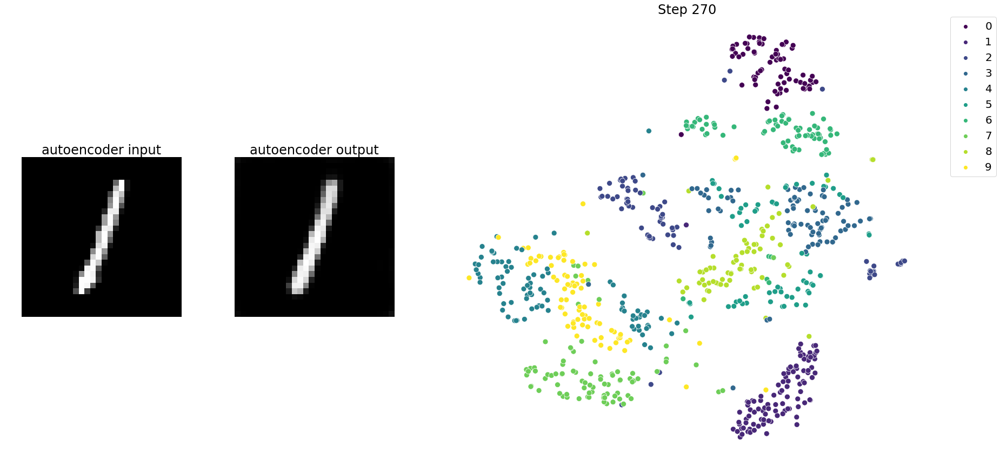

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 900 samples in 0.001s...
[t-SNE] Computed neighbors for 900 samples in 0.047s...
[t-SNE] Computed conditional probabilities for sample 900 / 900
[t-SNE] Mean sigma: 5.190527
[t-SNE] KL divergence after 250 iterations with early exaggeration: 64.692764
[t-SNE] KL divergence after 300 iterations: 0.961183


<Figure size 432x288 with 0 Axes>

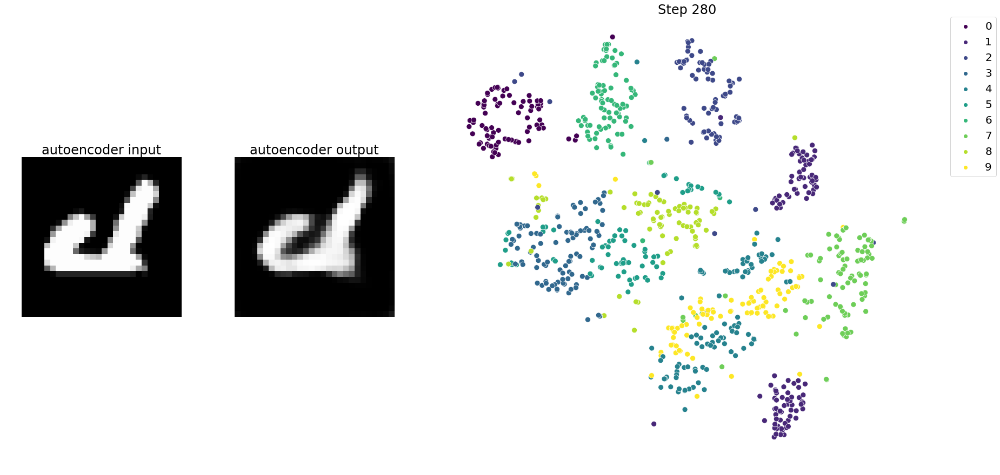

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.001s...
[t-SNE] Computed neighbors for 1000 samples in 0.066s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 5.100347
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.706093
[t-SNE] KL divergence after 300 iterations: 0.938846


<Figure size 432x288 with 0 Axes>

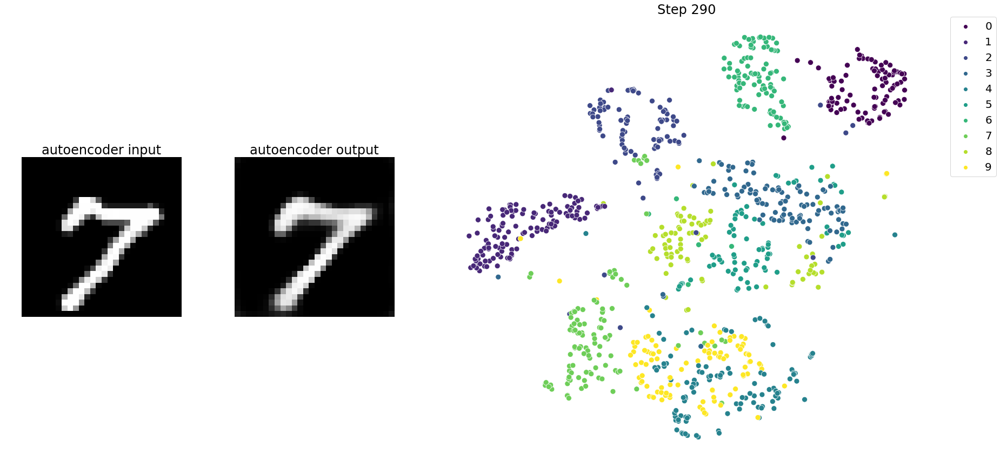

[t-SNE] Computing 99 nearest neighbors...
[t-SNE] Indexed 100 samples in 0.000s...
[t-SNE] Computed neighbors for 100 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 100 / 100
[t-SNE] Mean sigma: 8.996847
[t-SNE] KL divergence after 250 iterations with early exaggeration: 52.615349
[t-SNE] KL divergence after 300 iterations: 0.571256


<Figure size 432x288 with 0 Axes>

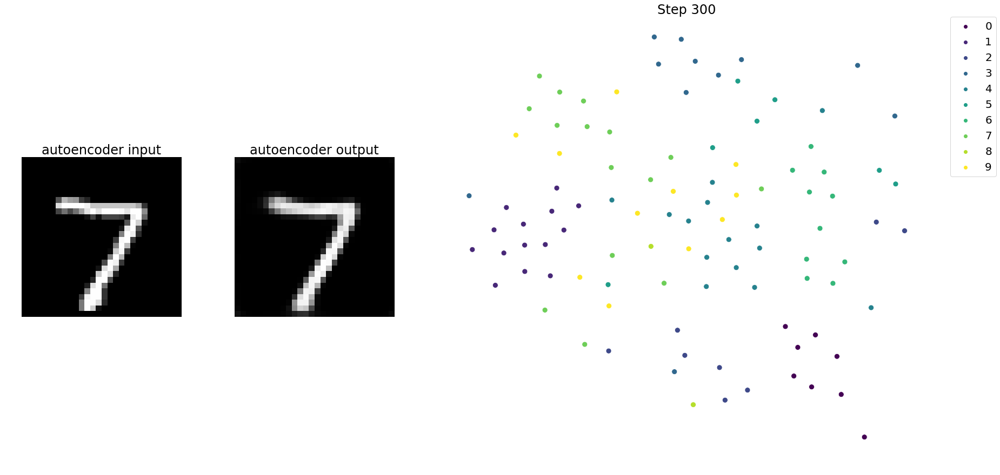

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 200 samples in 0.000s...
[t-SNE] Computed neighbors for 200 samples in 0.003s...
[t-SNE] Computed conditional probabilities for sample 200 / 200
[t-SNE] Mean sigma: 6.327854
[t-SNE] KL divergence after 250 iterations with early exaggeration: 58.981510
[t-SNE] KL divergence after 300 iterations: 0.756032


<Figure size 432x288 with 0 Axes>

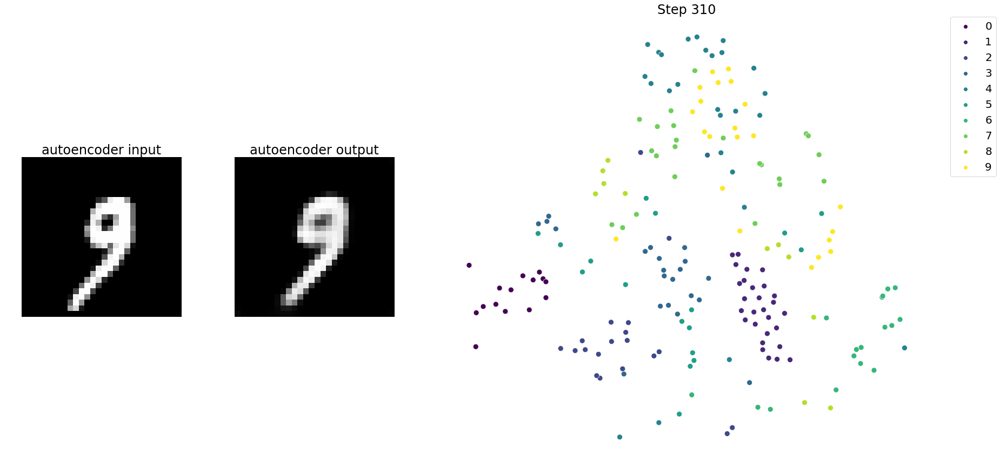

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 300 samples in 0.001s...
[t-SNE] Computed neighbors for 300 samples in 0.009s...
[t-SNE] Computed conditional probabilities for sample 300 / 300
[t-SNE] Mean sigma: 5.435062
[t-SNE] KL divergence after 250 iterations with early exaggeration: 62.105995
[t-SNE] KL divergence after 300 iterations: 0.881693


<Figure size 432x288 with 0 Axes>

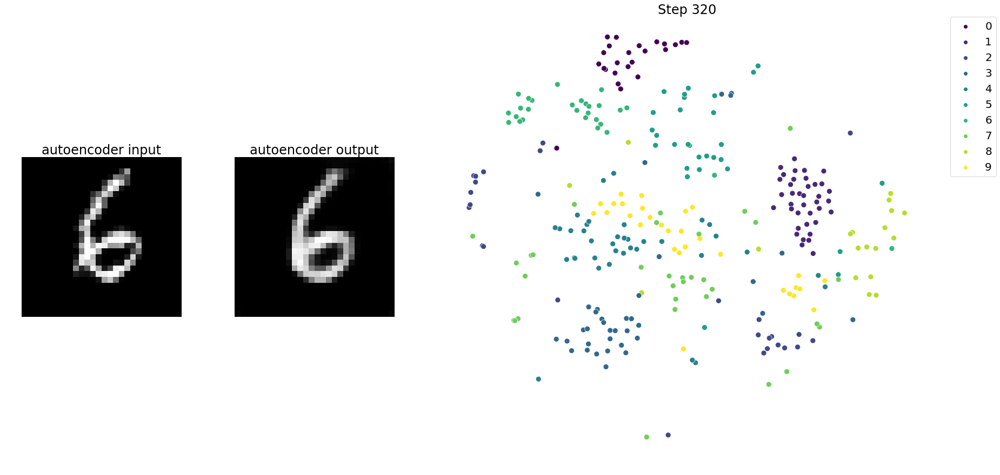

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.001s...
[t-SNE] Computed neighbors for 400 samples in 0.013s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 5.355179
[t-SNE] KL divergence after 250 iterations with early exaggeration: 63.598751
[t-SNE] KL divergence after 300 iterations: 0.938682


<Figure size 432x288 with 0 Axes>

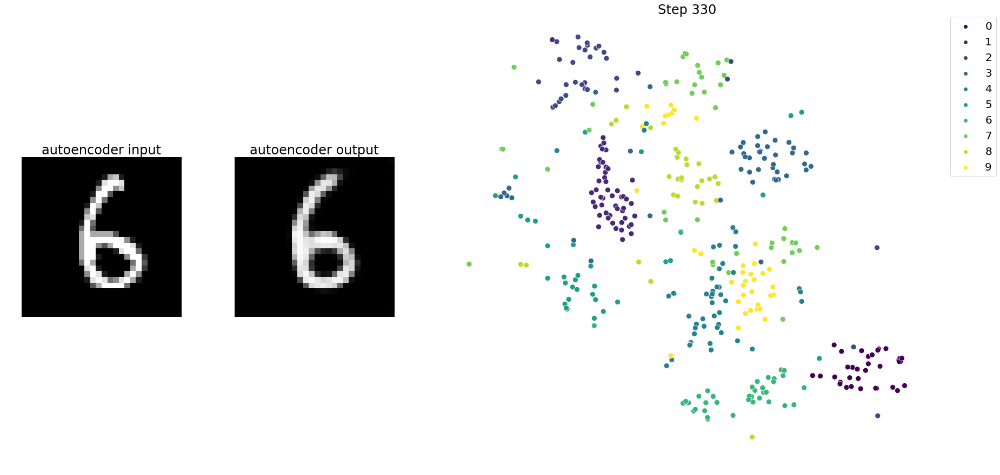

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 500 samples in 0.001s...
[t-SNE] Computed neighbors for 500 samples in 0.021s...
[t-SNE] Computed conditional probabilities for sample 500 / 500
[t-SNE] Mean sigma: 5.487727
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.730919
[t-SNE] KL divergence after 300 iterations: 0.776961


<Figure size 432x288 with 0 Axes>

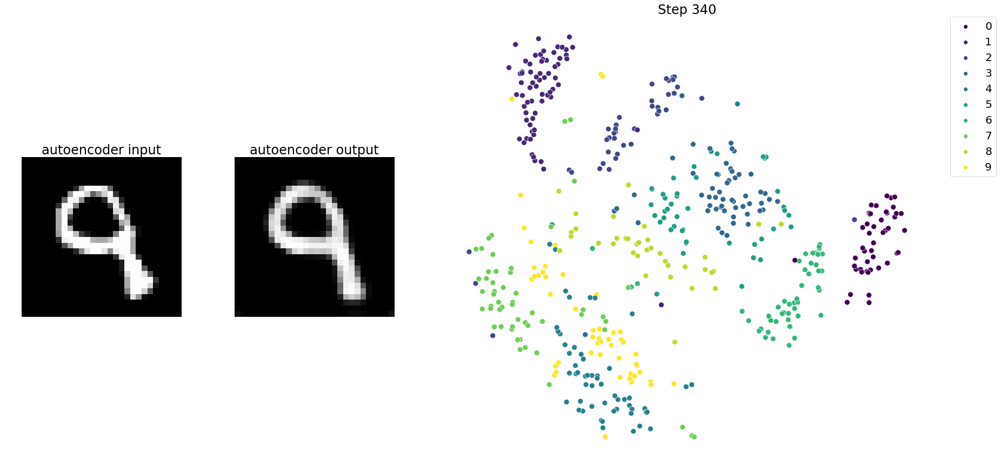

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 600 samples in 0.001s...
[t-SNE] Computed neighbors for 600 samples in 0.027s...
[t-SNE] Computed conditional probabilities for sample 600 / 600
[t-SNE] Mean sigma: 5.447877
[t-SNE] KL divergence after 250 iterations with early exaggeration: 66.129707
[t-SNE] KL divergence after 300 iterations: 0.799043


<Figure size 432x288 with 0 Axes>

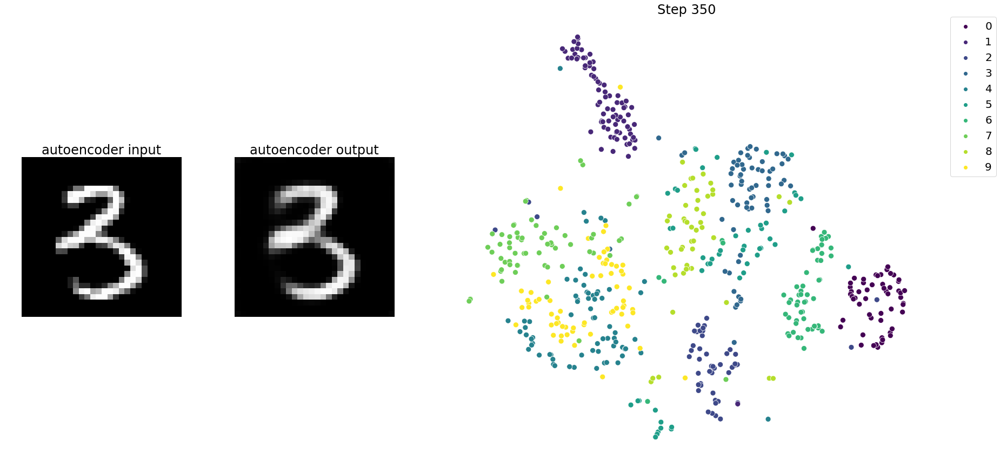

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 700 samples in 0.001s...
[t-SNE] Computed neighbors for 700 samples in 0.036s...
[t-SNE] Computed conditional probabilities for sample 700 / 700
[t-SNE] Mean sigma: 5.403528
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.046616
[t-SNE] KL divergence after 300 iterations: 0.825375


<Figure size 432x288 with 0 Axes>

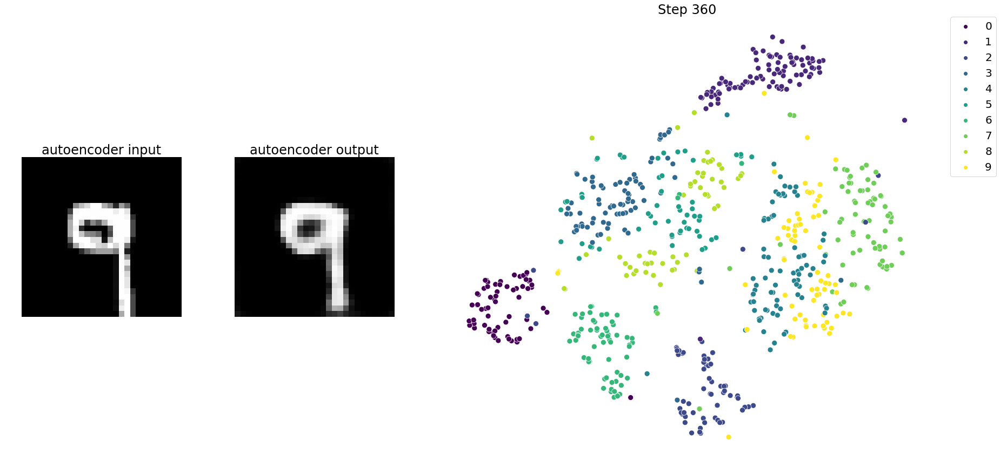

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 800 samples in 0.001s...
[t-SNE] Computed neighbors for 800 samples in 0.040s...
[t-SNE] Computed conditional probabilities for sample 800 / 800
[t-SNE] Mean sigma: 5.271463
[t-SNE] KL divergence after 250 iterations with early exaggeration: 64.567139
[t-SNE] KL divergence after 300 iterations: 0.863820


<Figure size 432x288 with 0 Axes>

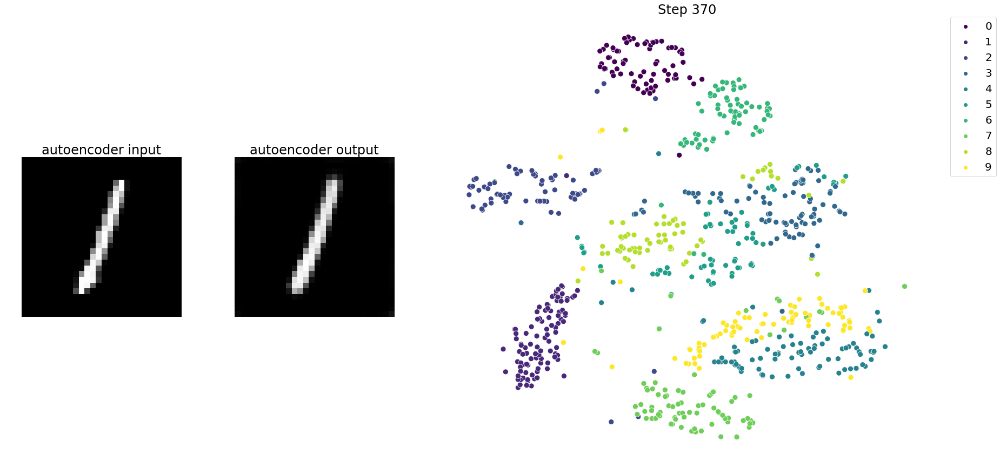

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 900 samples in 0.001s...
[t-SNE] Computed neighbors for 900 samples in 0.053s...
[t-SNE] Computed conditional probabilities for sample 900 / 900
[t-SNE] Mean sigma: 5.193296
[t-SNE] KL divergence after 250 iterations with early exaggeration: 64.820511
[t-SNE] KL divergence after 300 iterations: 0.928231


<Figure size 432x288 with 0 Axes>

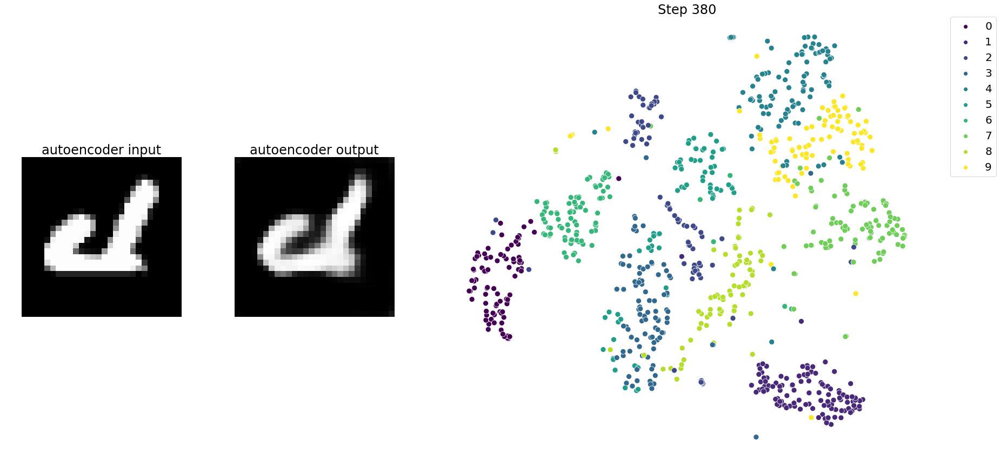

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.001s...
[t-SNE] Computed neighbors for 1000 samples in 0.070s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 5.177778
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.662689
[t-SNE] KL divergence after 300 iterations: 0.938276


<Figure size 432x288 with 0 Axes>

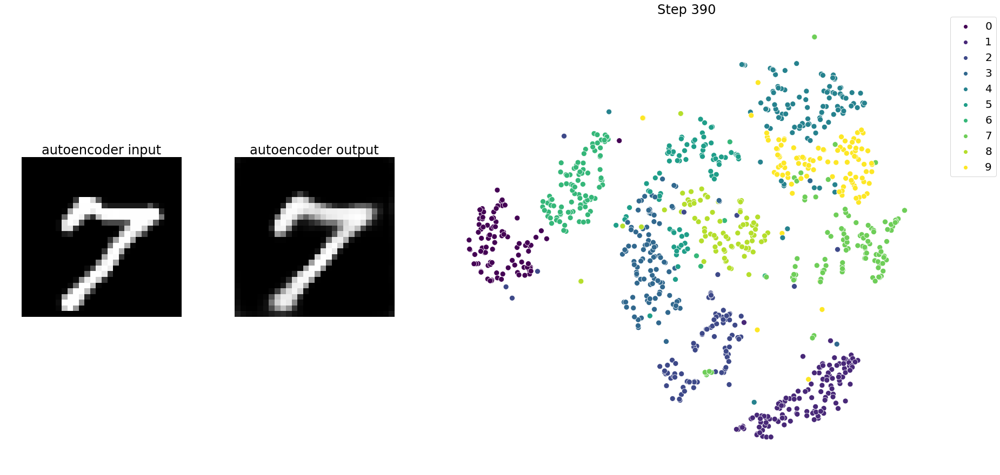

[t-SNE] Computing 99 nearest neighbors...
[t-SNE] Indexed 100 samples in 0.000s...
[t-SNE] Computed neighbors for 100 samples in 0.003s...
[t-SNE] Computed conditional probabilities for sample 100 / 100
[t-SNE] Mean sigma: 9.195462
[t-SNE] KL divergence after 250 iterations with early exaggeration: 50.802948
[t-SNE] KL divergence after 300 iterations: 0.776614


<Figure size 432x288 with 0 Axes>

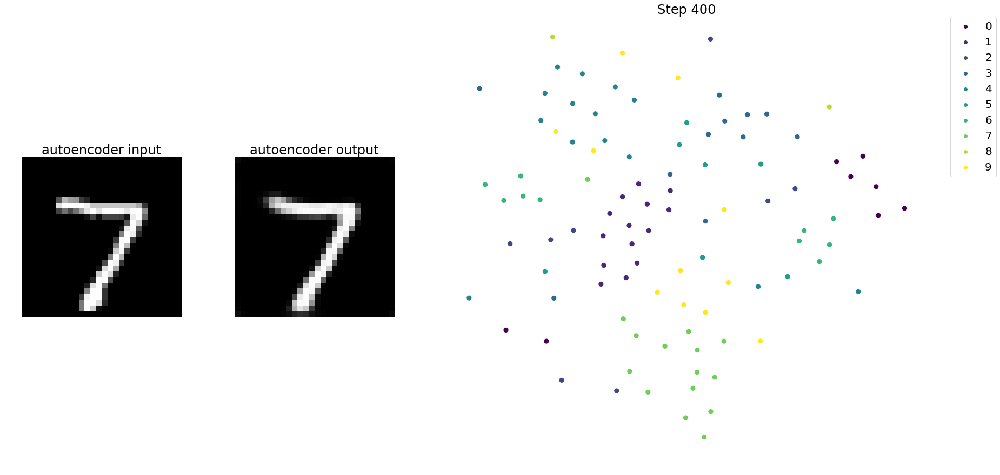

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 200 samples in 0.000s...
[t-SNE] Computed neighbors for 200 samples in 0.003s...
[t-SNE] Computed conditional probabilities for sample 200 / 200
[t-SNE] Mean sigma: 6.430018
[t-SNE] KL divergence after 250 iterations with early exaggeration: 58.592861
[t-SNE] KL divergence after 300 iterations: 0.687518


<Figure size 432x288 with 0 Axes>

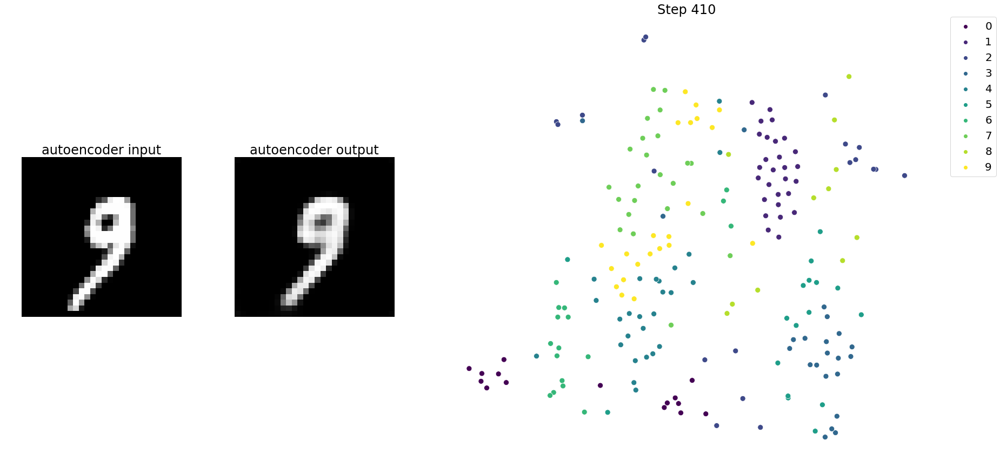

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 300 samples in 0.001s...
[t-SNE] Computed neighbors for 300 samples in 0.009s...
[t-SNE] Computed conditional probabilities for sample 300 / 300
[t-SNE] Mean sigma: 5.513207
[t-SNE] KL divergence after 250 iterations with early exaggeration: 61.692558
[t-SNE] KL divergence after 300 iterations: 0.983186


<Figure size 432x288 with 0 Axes>

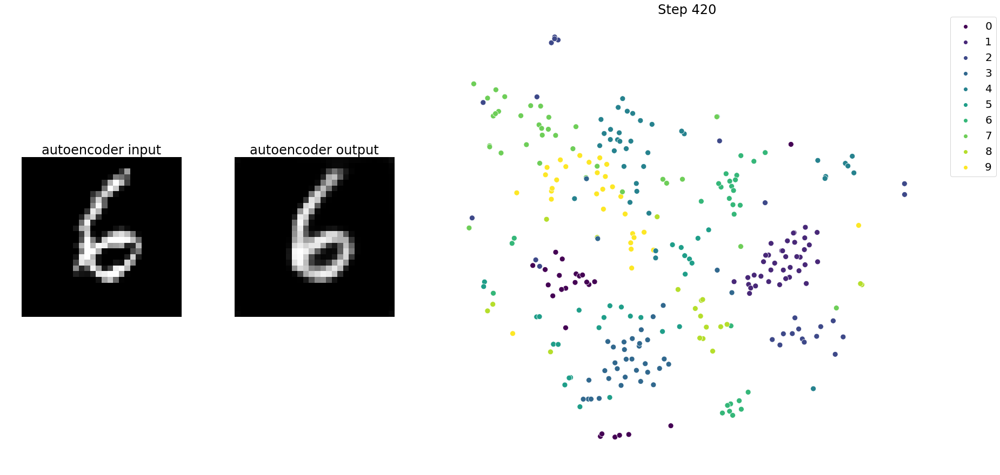

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.000s...
[t-SNE] Computed neighbors for 400 samples in 0.014s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 4.931824
[t-SNE] KL divergence after 250 iterations with early exaggeration: 66.165054
[t-SNE] KL divergence after 300 iterations: 0.865254


<Figure size 432x288 with 0 Axes>

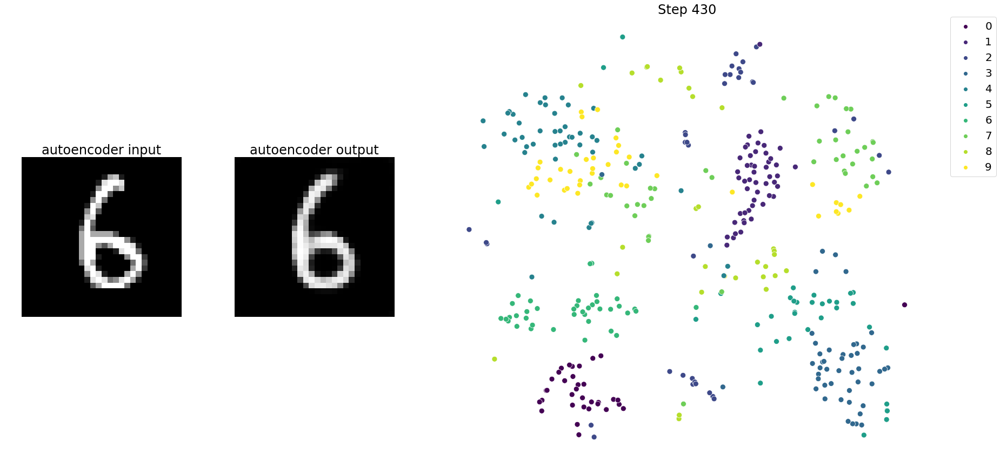

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 500 samples in 0.001s...
[t-SNE] Computed neighbors for 500 samples in 0.022s...
[t-SNE] Computed conditional probabilities for sample 500 / 500
[t-SNE] Mean sigma: 5.010149
[t-SNE] KL divergence after 250 iterations with early exaggeration: 68.218811
[t-SNE] KL divergence after 300 iterations: 0.939008


<Figure size 432x288 with 0 Axes>

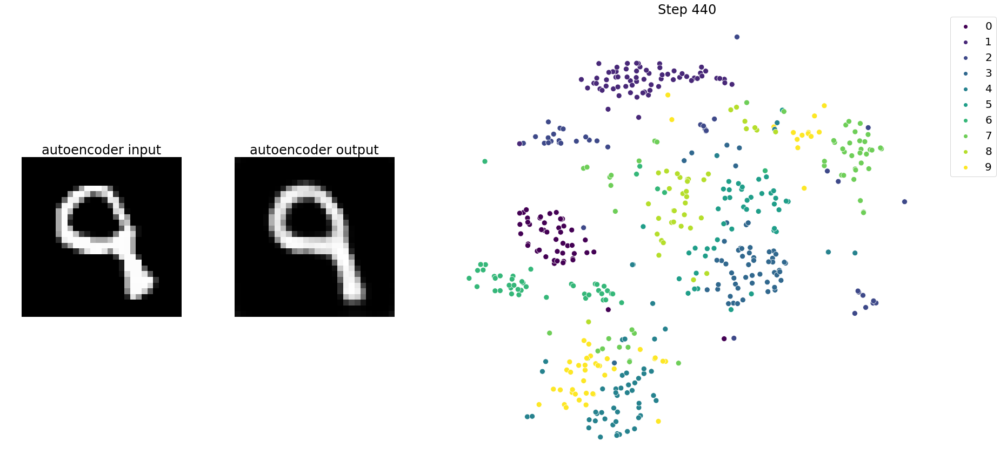

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 600 samples in 0.001s...
[t-SNE] Computed neighbors for 600 samples in 0.027s...
[t-SNE] Computed conditional probabilities for sample 600 / 600
[t-SNE] Mean sigma: 5.065313
[t-SNE] KL divergence after 250 iterations with early exaggeration: 66.872856
[t-SNE] KL divergence after 300 iterations: 0.816019


<Figure size 432x288 with 0 Axes>

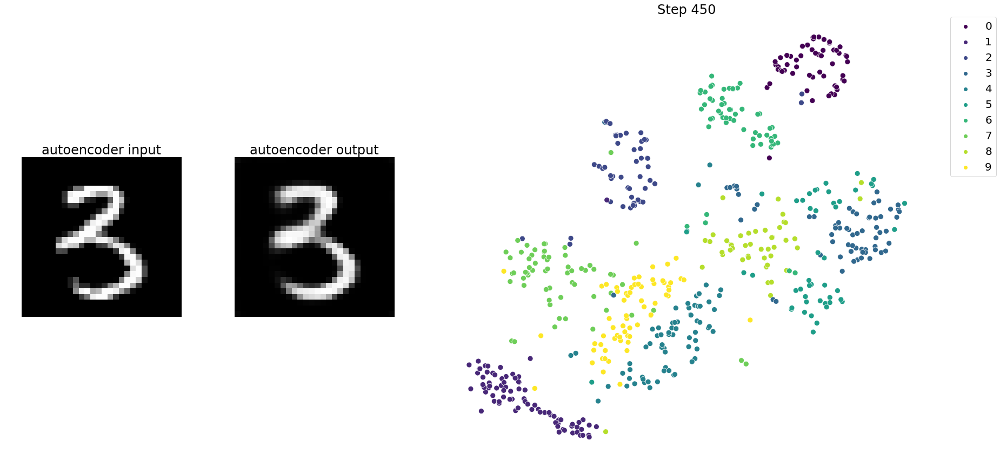

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 700 samples in 0.001s...
[t-SNE] Computed neighbors for 700 samples in 0.033s...
[t-SNE] Computed conditional probabilities for sample 700 / 700
[t-SNE] Mean sigma: 5.096793
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.338623
[t-SNE] KL divergence after 300 iterations: 0.845489


<Figure size 432x288 with 0 Axes>

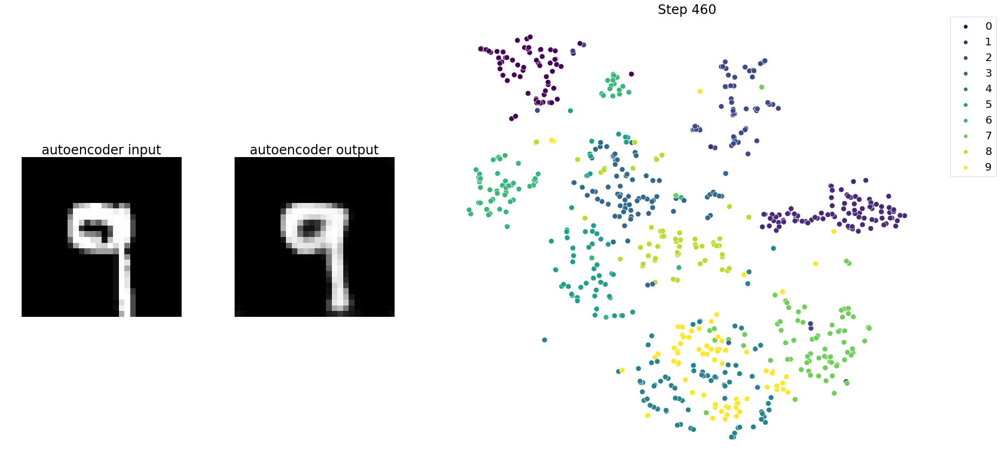

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 800 samples in 0.001s...
[t-SNE] Computed neighbors for 800 samples in 0.040s...
[t-SNE] Computed conditional probabilities for sample 800 / 800
[t-SNE] Mean sigma: 5.033671
[t-SNE] KL divergence after 250 iterations with early exaggeration: 64.733429
[t-SNE] KL divergence after 300 iterations: 0.919186


<Figure size 432x288 with 0 Axes>

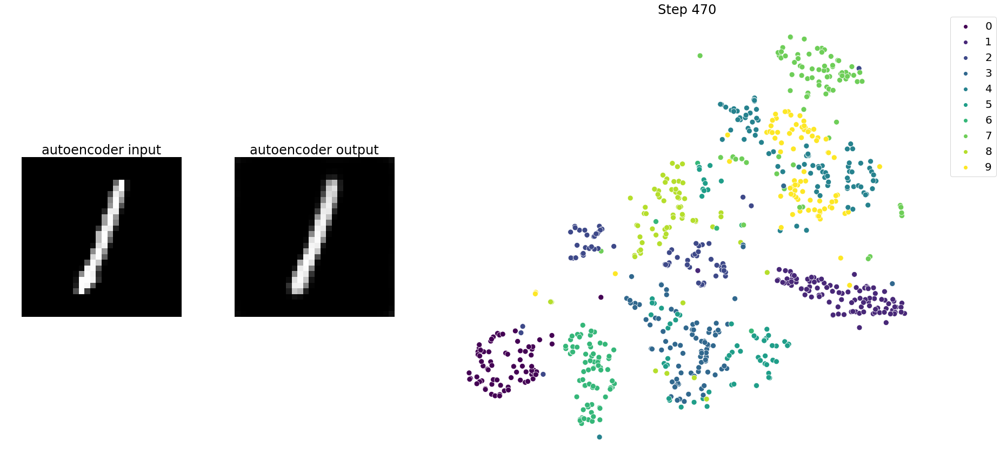

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 900 samples in 0.001s...
[t-SNE] Computed neighbors for 900 samples in 0.048s...
[t-SNE] Computed conditional probabilities for sample 900 / 900
[t-SNE] Mean sigma: 5.001751
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.003891
[t-SNE] KL divergence after 300 iterations: 0.910329


<Figure size 432x288 with 0 Axes>

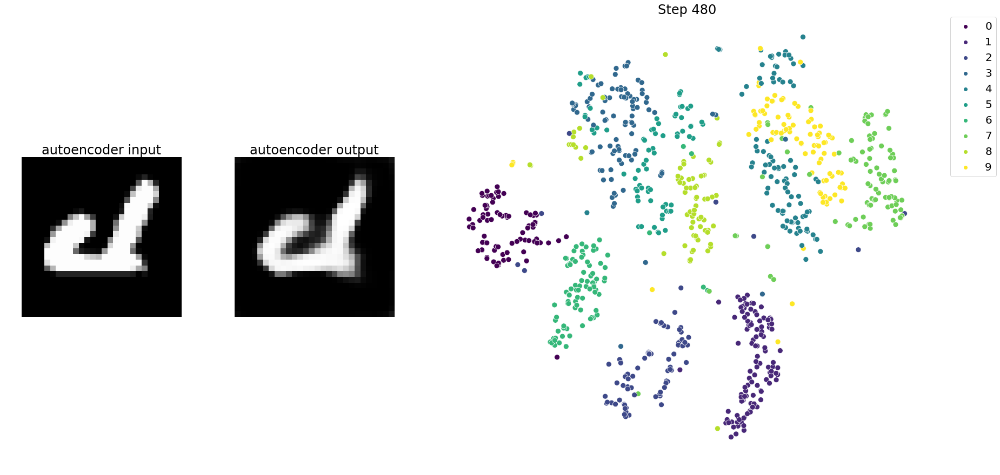

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.001s...
[t-SNE] Computed neighbors for 1000 samples in 0.067s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 5.079456
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.653336
[t-SNE] KL divergence after 300 iterations: 0.942325


<Figure size 432x288 with 0 Axes>

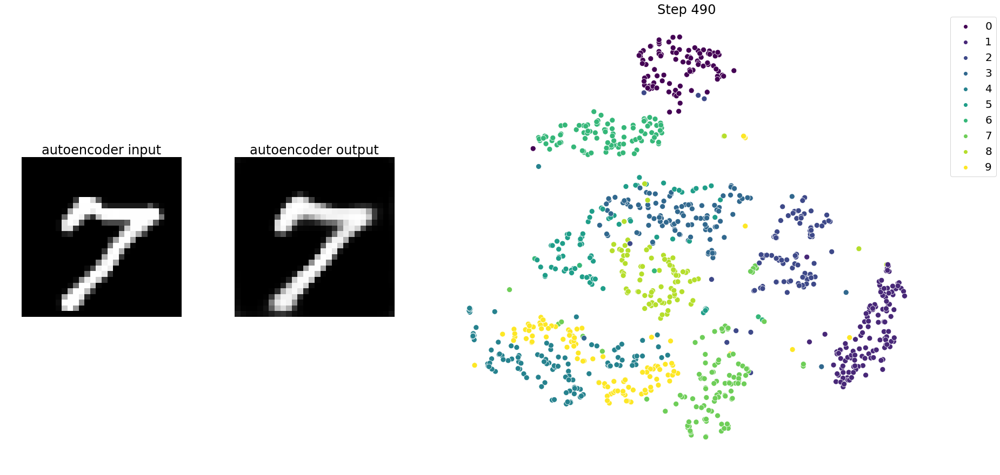

[t-SNE] Computing 99 nearest neighbors...
[t-SNE] Indexed 100 samples in 0.000s...
[t-SNE] Computed neighbors for 100 samples in 0.002s...
[t-SNE] Computed conditional probabilities for sample 100 / 100
[t-SNE] Mean sigma: 6.753114
[t-SNE] KL divergence after 250 iterations with early exaggeration: 51.617046
[t-SNE] KL divergence after 300 iterations: 0.765424


<Figure size 432x288 with 0 Axes>

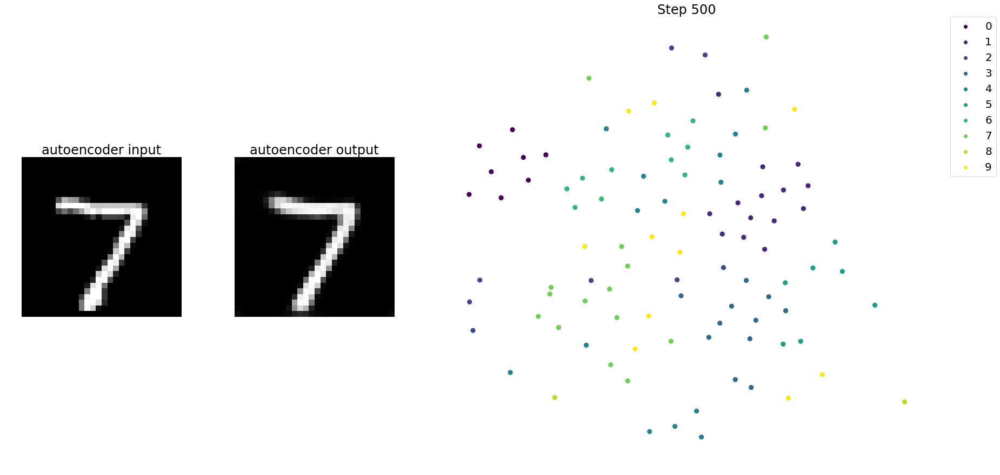

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 200 samples in 0.000s...
[t-SNE] Computed neighbors for 200 samples in 0.003s...
[t-SNE] Computed conditional probabilities for sample 200 / 200
[t-SNE] Mean sigma: 5.219982
[t-SNE] KL divergence after 250 iterations with early exaggeration: 59.581596
[t-SNE] KL divergence after 300 iterations: 0.897308


<Figure size 432x288 with 0 Axes>

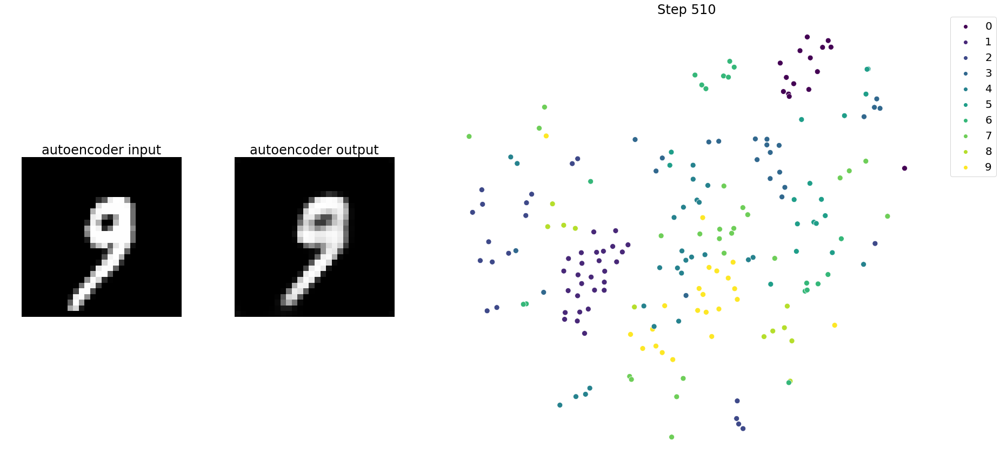

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 300 samples in 0.000s...
[t-SNE] Computed neighbors for 300 samples in 0.009s...
[t-SNE] Computed conditional probabilities for sample 300 / 300
[t-SNE] Mean sigma: 5.023133
[t-SNE] KL divergence after 250 iterations with early exaggeration: 61.233490
[t-SNE] KL divergence after 300 iterations: 0.850689


<Figure size 432x288 with 0 Axes>

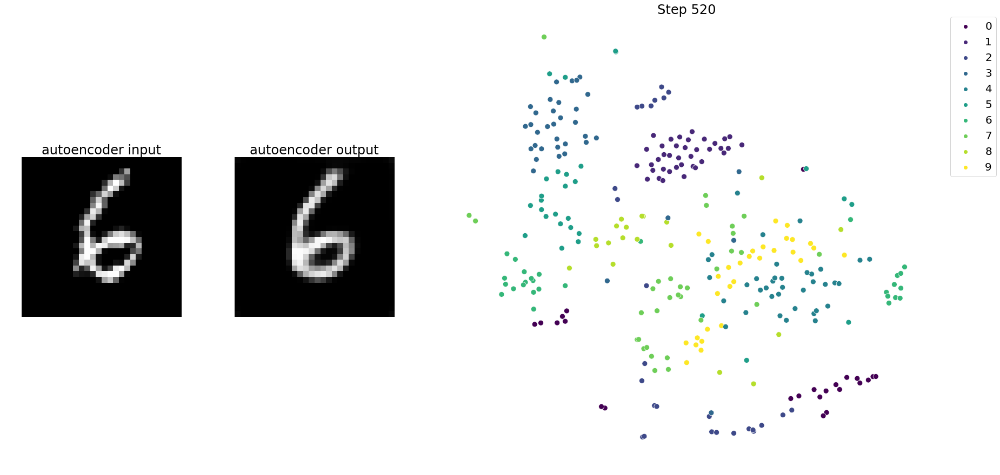

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.001s...
[t-SNE] Computed neighbors for 400 samples in 0.013s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 4.527272
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.099480
[t-SNE] KL divergence after 300 iterations: 0.876568


<Figure size 432x288 with 0 Axes>

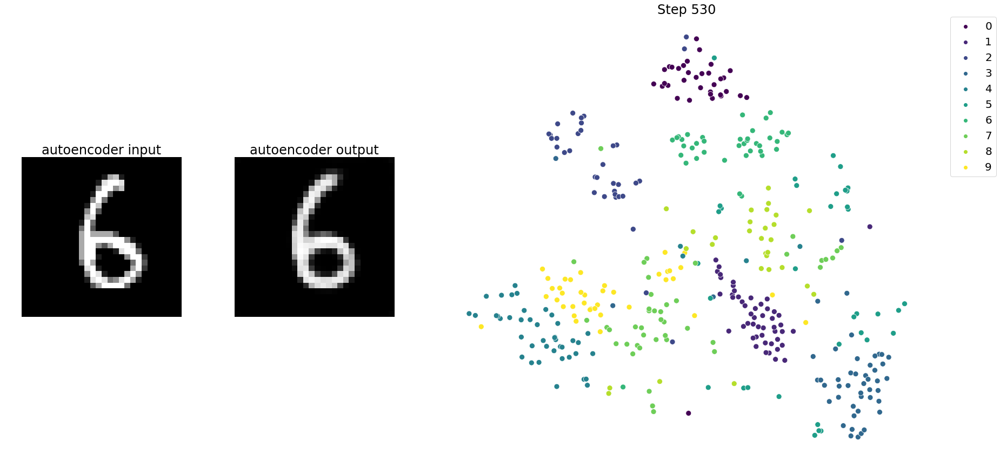

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 500 samples in 0.001s...
[t-SNE] Computed neighbors for 500 samples in 0.021s...
[t-SNE] Computed conditional probabilities for sample 500 / 500
[t-SNE] Mean sigma: 4.661876
[t-SNE] KL divergence after 250 iterations with early exaggeration: 66.897728
[t-SNE] KL divergence after 300 iterations: 0.847088


<Figure size 432x288 with 0 Axes>

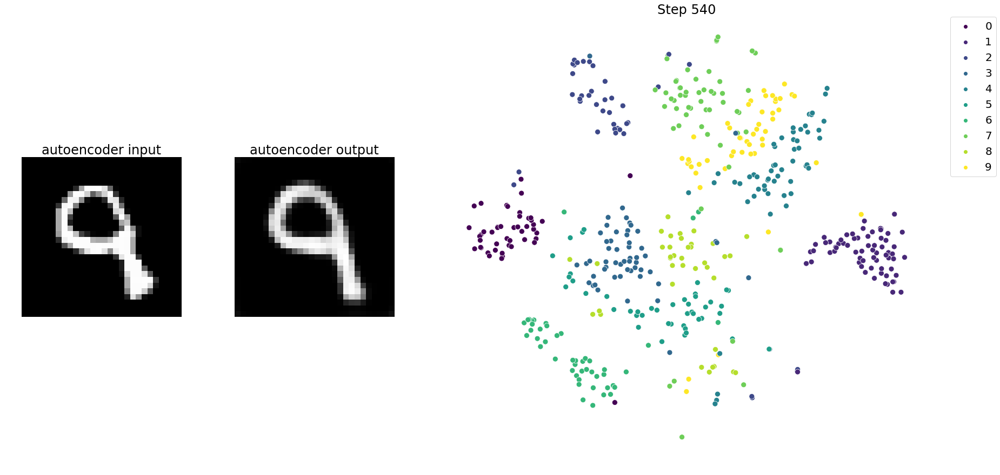

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 600 samples in 0.001s...
[t-SNE] Computed neighbors for 600 samples in 0.027s...
[t-SNE] Computed conditional probabilities for sample 600 / 600
[t-SNE] Mean sigma: 4.946769
[t-SNE] KL divergence after 250 iterations with early exaggeration: 67.079285
[t-SNE] KL divergence after 300 iterations: 0.826237


<Figure size 432x288 with 0 Axes>

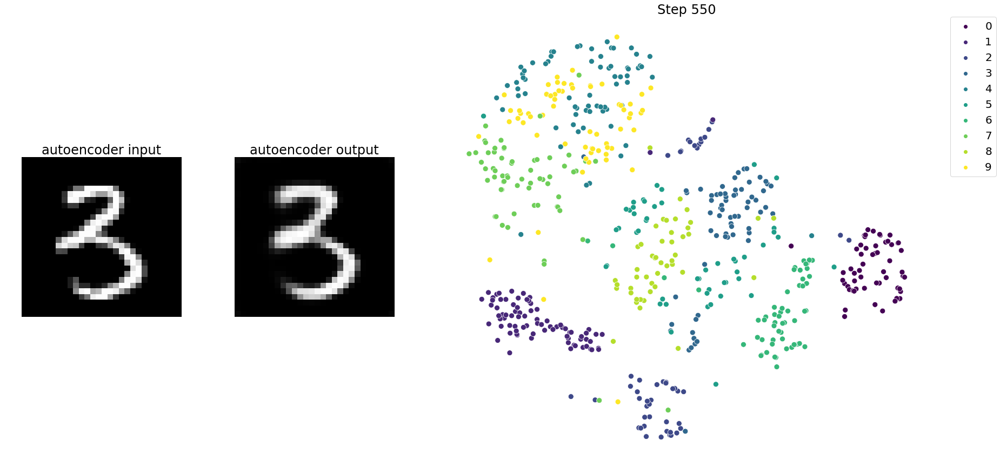

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 700 samples in 0.001s...
[t-SNE] Computed neighbors for 700 samples in 0.034s...
[t-SNE] Computed conditional probabilities for sample 700 / 700
[t-SNE] Mean sigma: 4.992970
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.786179
[t-SNE] KL divergence after 300 iterations: 0.853628


<Figure size 432x288 with 0 Axes>

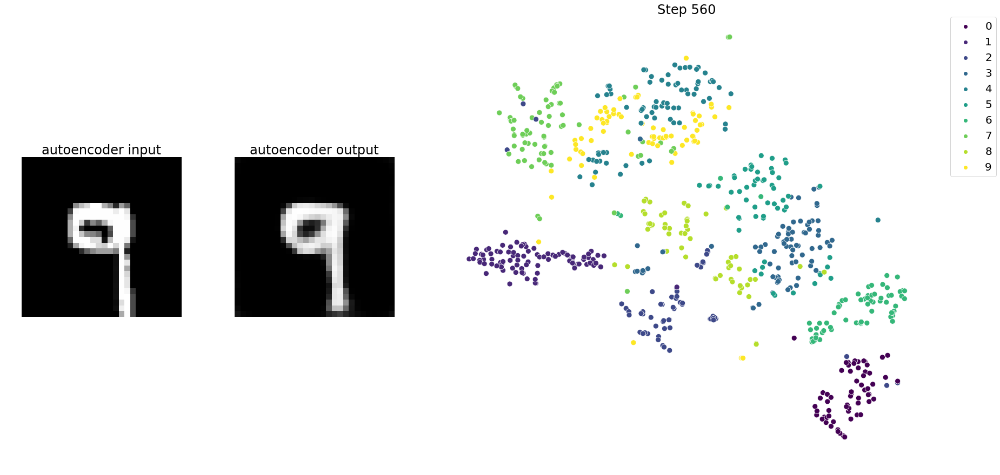

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 800 samples in 0.001s...
[t-SNE] Computed neighbors for 800 samples in 0.042s...
[t-SNE] Computed conditional probabilities for sample 800 / 800
[t-SNE] Mean sigma: 4.942434
[t-SNE] KL divergence after 250 iterations with early exaggeration: 64.921005
[t-SNE] KL divergence after 300 iterations: 0.886099


<Figure size 432x288 with 0 Axes>

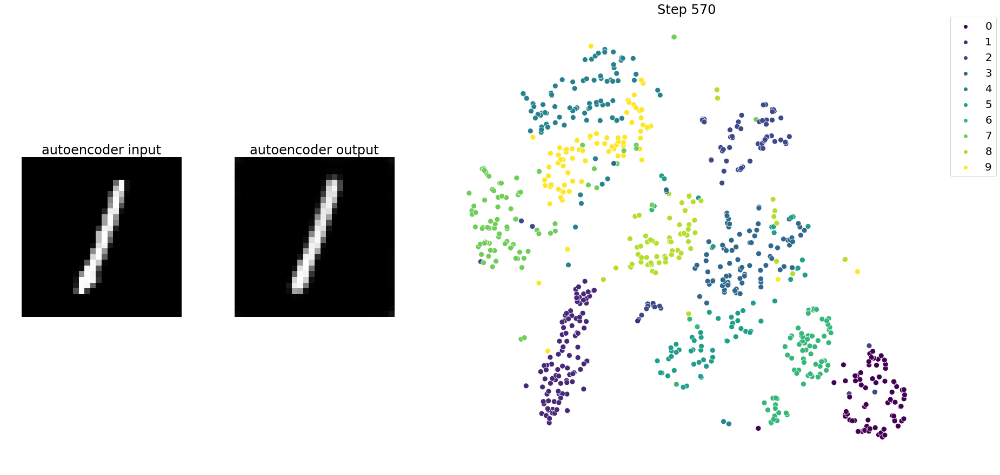

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 900 samples in 0.001s...
[t-SNE] Computed neighbors for 900 samples in 0.047s...
[t-SNE] Computed conditional probabilities for sample 900 / 900
[t-SNE] Mean sigma: 4.922480
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.360649
[t-SNE] KL divergence after 300 iterations: 0.903832


<Figure size 432x288 with 0 Axes>

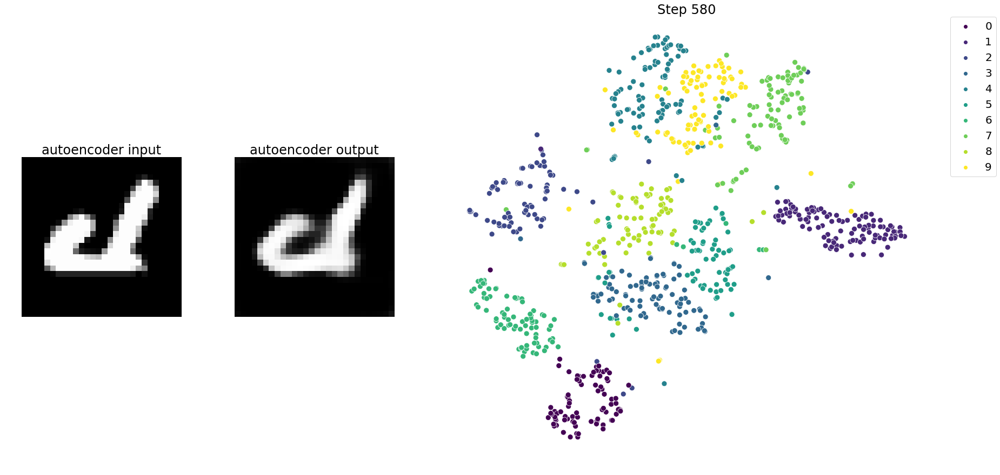

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.001s...
[t-SNE] Computed neighbors for 1000 samples in 0.066s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 5.005317
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.682114
[t-SNE] KL divergence after 300 iterations: 0.983549


<Figure size 432x288 with 0 Axes>

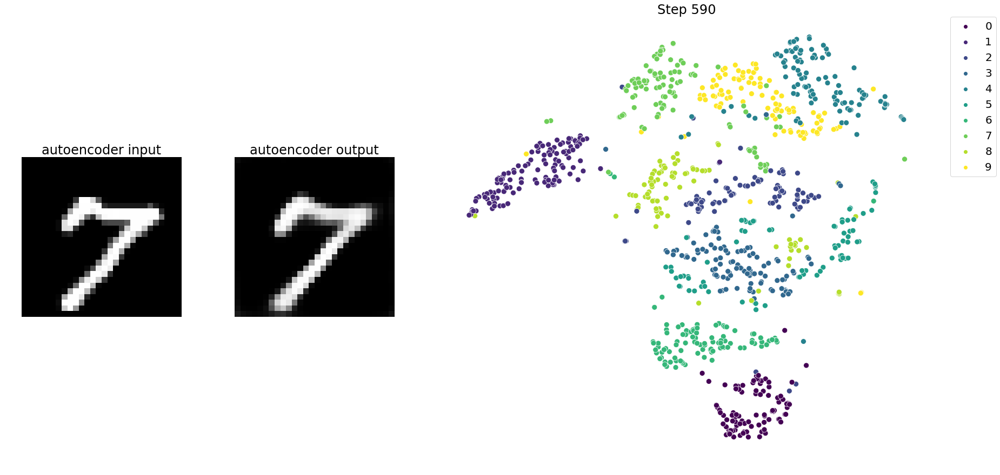

[t-SNE] Computing 99 nearest neighbors...
[t-SNE] Indexed 100 samples in 0.000s...
[t-SNE] Computed neighbors for 100 samples in 0.002s...
[t-SNE] Computed conditional probabilities for sample 100 / 100
[t-SNE] Mean sigma: 9.164269
[t-SNE] KL divergence after 250 iterations with early exaggeration: 51.147022
[t-SNE] KL divergence after 300 iterations: 0.576834


<Figure size 432x288 with 0 Axes>

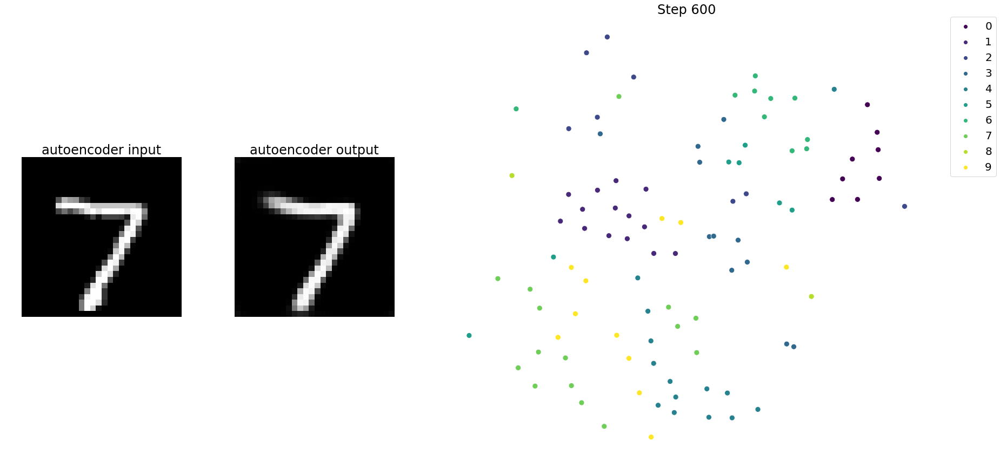

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 200 samples in 0.000s...
[t-SNE] Computed neighbors for 200 samples in 0.007s...
[t-SNE] Computed conditional probabilities for sample 200 / 200
[t-SNE] Mean sigma: 4.904206
[t-SNE] KL divergence after 250 iterations with early exaggeration: 60.205692
[t-SNE] KL divergence after 300 iterations: 0.855123


<Figure size 432x288 with 0 Axes>

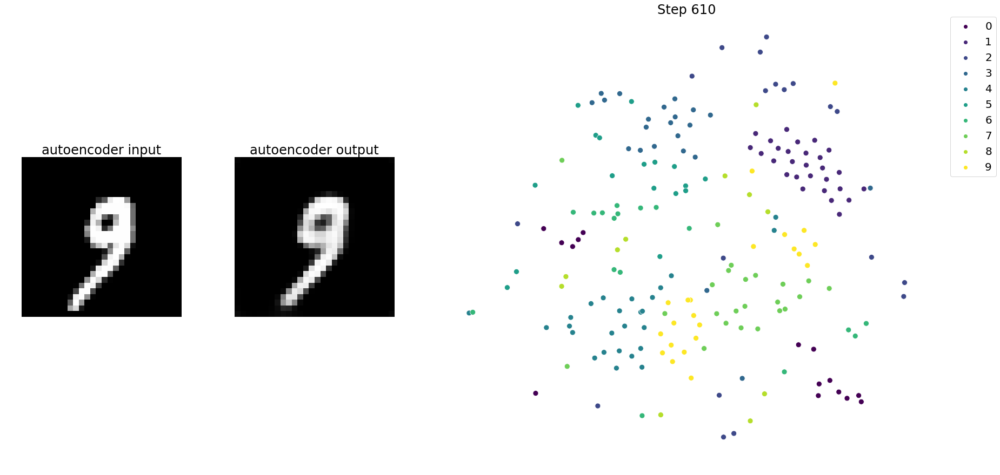

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 300 samples in 0.000s...
[t-SNE] Computed neighbors for 300 samples in 0.010s...
[t-SNE] Computed conditional probabilities for sample 300 / 300
[t-SNE] Mean sigma: 5.264880
[t-SNE] KL divergence after 250 iterations with early exaggeration: 61.441196
[t-SNE] KL divergence after 300 iterations: 0.796887


<Figure size 432x288 with 0 Axes>

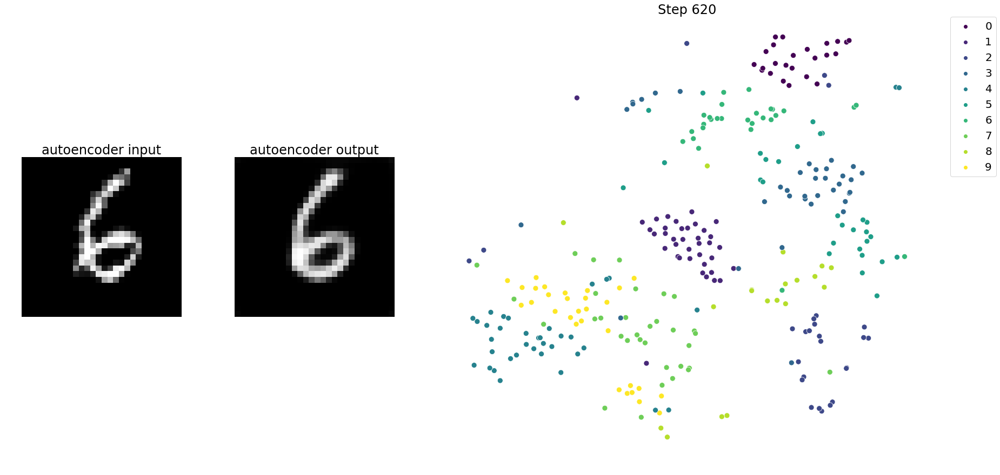

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.001s...
[t-SNE] Computed neighbors for 400 samples in 0.014s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 5.270647
[t-SNE] KL divergence after 250 iterations with early exaggeration: 66.600555
[t-SNE] KL divergence after 300 iterations: 0.917903


<Figure size 432x288 with 0 Axes>

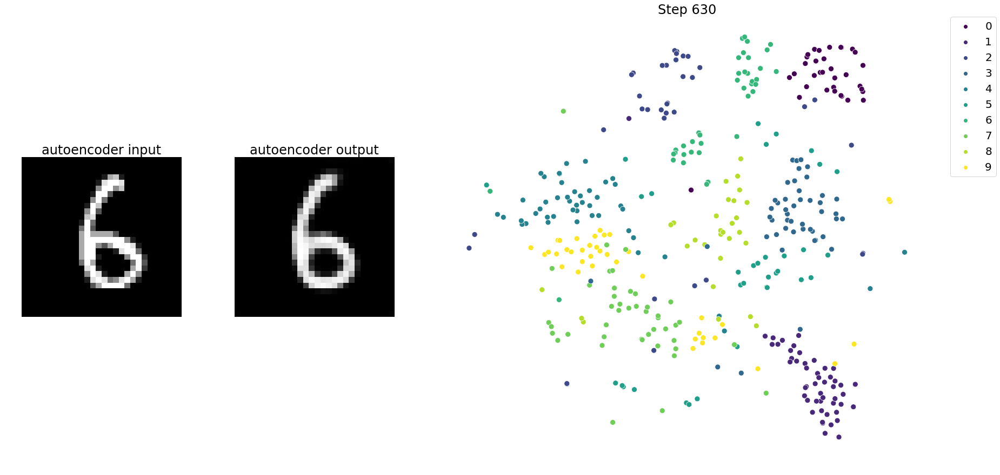

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 500 samples in 0.001s...
[t-SNE] Computed neighbors for 500 samples in 0.021s...
[t-SNE] Computed conditional probabilities for sample 500 / 500
[t-SNE] Mean sigma: 5.026110
[t-SNE] KL divergence after 250 iterations with early exaggeration: 67.107170
[t-SNE] KL divergence after 300 iterations: 0.861730


<Figure size 432x288 with 0 Axes>

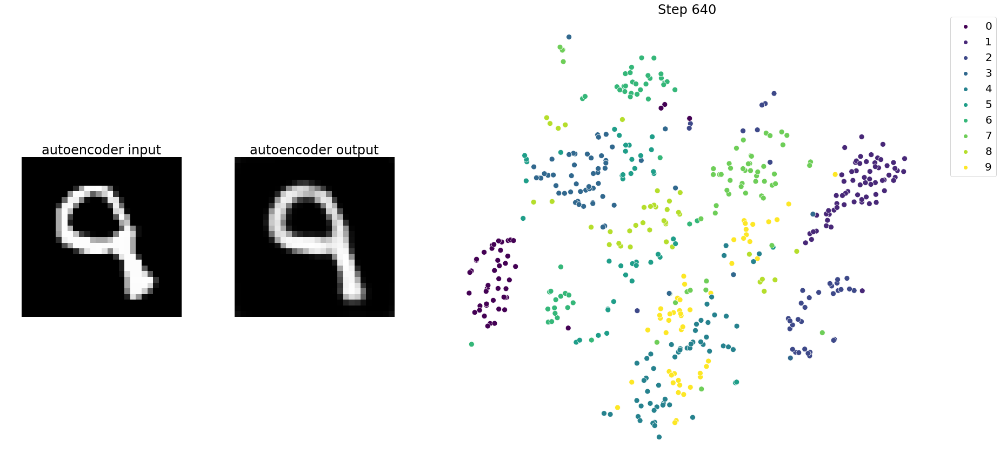

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 600 samples in 0.001s...
[t-SNE] Computed neighbors for 600 samples in 0.027s...
[t-SNE] Computed conditional probabilities for sample 600 / 600
[t-SNE] Mean sigma: 5.194083
[t-SNE] KL divergence after 250 iterations with early exaggeration: 66.095428
[t-SNE] KL divergence after 300 iterations: 0.916888


<Figure size 432x288 with 0 Axes>

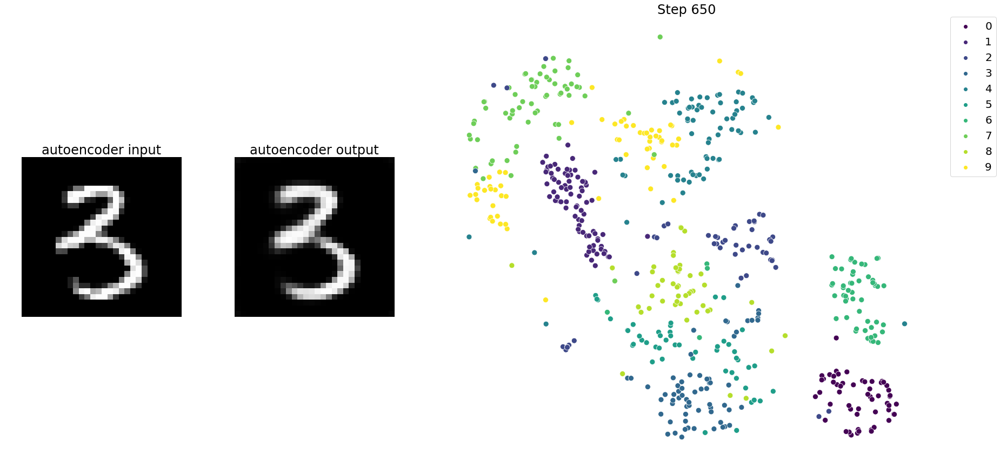

[t-SNE] Computing 99 nearest neighbors...
[t-SNE] Indexed 100 samples in 0.000s...
[t-SNE] Computed neighbors for 100 samples in 0.002s...
[t-SNE] Computed conditional probabilities for sample 100 / 100
[t-SNE] Mean sigma: 9.589551
[t-SNE] KL divergence after 250 iterations with early exaggeration: 51.228840
[t-SNE] KL divergence after 300 iterations: 0.366064


<Figure size 432x288 with 0 Axes>

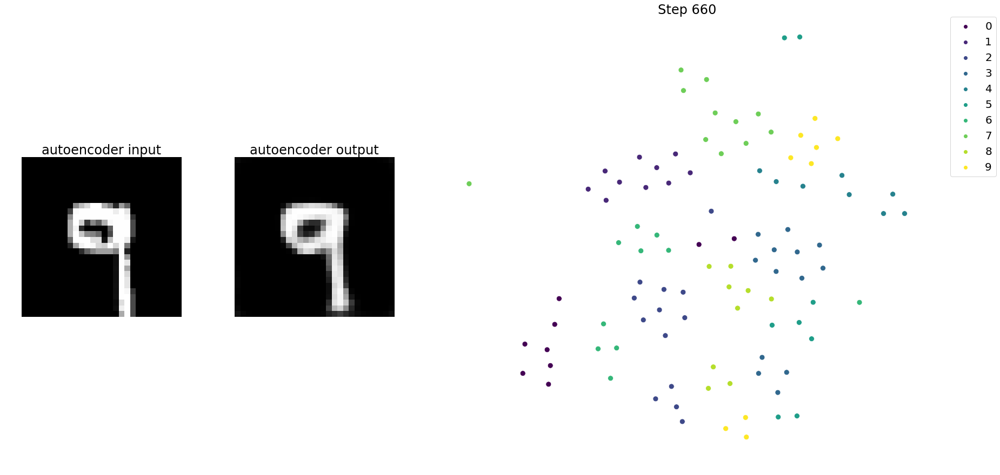

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 200 samples in 0.000s...
[t-SNE] Computed neighbors for 200 samples in 0.003s...
[t-SNE] Computed conditional probabilities for sample 200 / 200
[t-SNE] Mean sigma: 8.033790
[t-SNE] KL divergence after 250 iterations with early exaggeration: 58.782955
[t-SNE] KL divergence after 300 iterations: 0.644960


<Figure size 432x288 with 0 Axes>

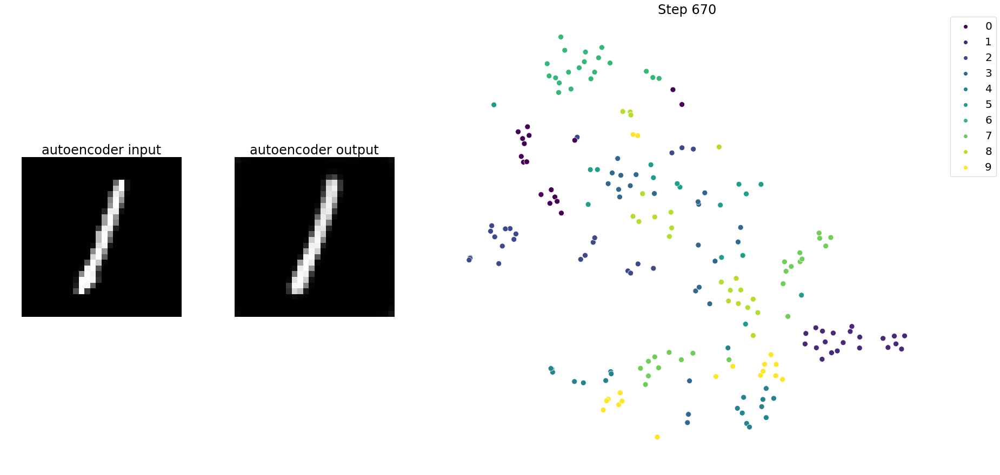

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 300 samples in 0.000s...
[t-SNE] Computed neighbors for 300 samples in 0.009s...
[t-SNE] Computed conditional probabilities for sample 300 / 300
[t-SNE] Mean sigma: 7.263271
[t-SNE] KL divergence after 250 iterations with early exaggeration: 61.689796
[t-SNE] KL divergence after 300 iterations: 0.701828


<Figure size 432x288 with 0 Axes>

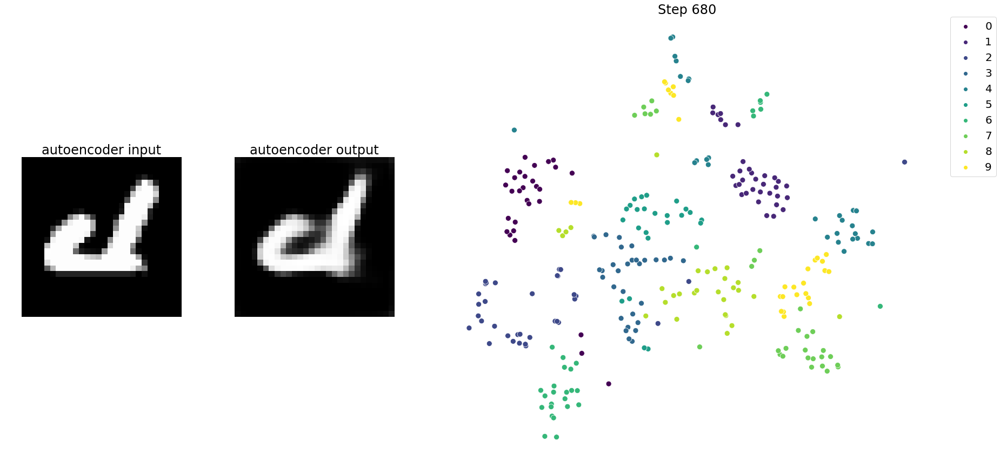

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.001s...
[t-SNE] Computed neighbors for 400 samples in 0.013s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 6.642232
[t-SNE] KL divergence after 250 iterations with early exaggeration: 64.557816
[t-SNE] KL divergence after 300 iterations: 0.801677


<Figure size 432x288 with 0 Axes>

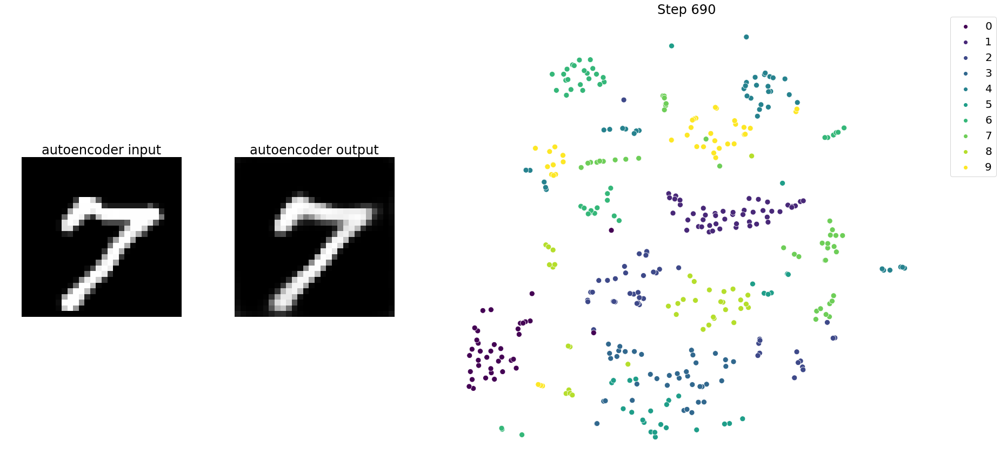

[t-SNE] Computing 99 nearest neighbors...
[t-SNE] Indexed 100 samples in 0.000s...
[t-SNE] Computed neighbors for 100 samples in 0.002s...
[t-SNE] Computed conditional probabilities for sample 100 / 100
[t-SNE] Mean sigma: 9.205826
[t-SNE] KL divergence after 250 iterations with early exaggeration: 50.538235
[t-SNE] KL divergence after 300 iterations: 0.423016


<Figure size 432x288 with 0 Axes>

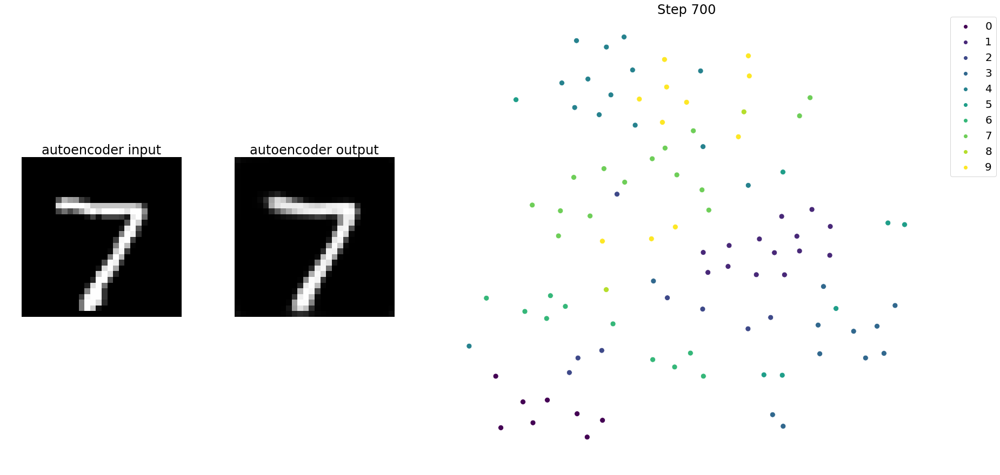

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 200 samples in 0.000s...
[t-SNE] Computed neighbors for 200 samples in 0.003s...
[t-SNE] Computed conditional probabilities for sample 200 / 200
[t-SNE] Mean sigma: 6.439744
[t-SNE] KL divergence after 250 iterations with early exaggeration: 57.637062
[t-SNE] KL divergence after 300 iterations: 0.924624


<Figure size 432x288 with 0 Axes>

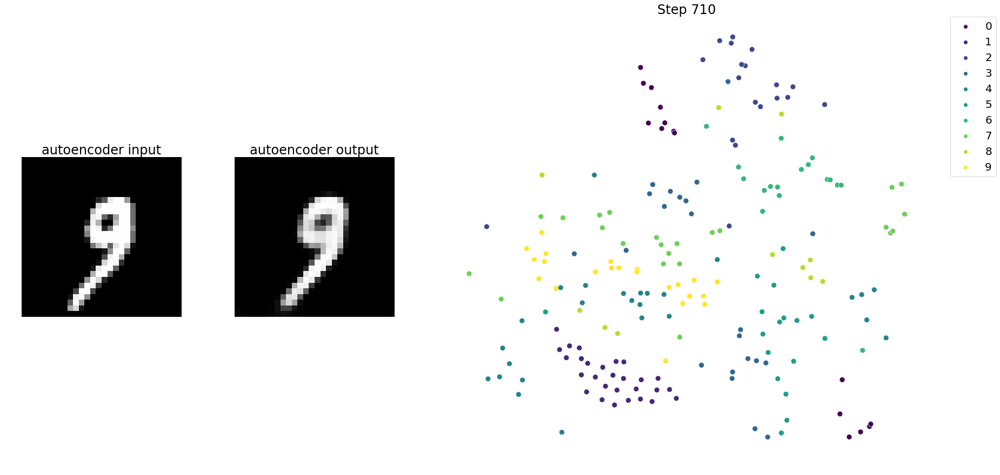

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 300 samples in 0.000s...
[t-SNE] Computed neighbors for 300 samples in 0.010s...
[t-SNE] Computed conditional probabilities for sample 300 / 300
[t-SNE] Mean sigma: 6.201712
[t-SNE] KL divergence after 250 iterations with early exaggeration: 61.435444
[t-SNE] KL divergence after 300 iterations: 0.799023


<Figure size 432x288 with 0 Axes>

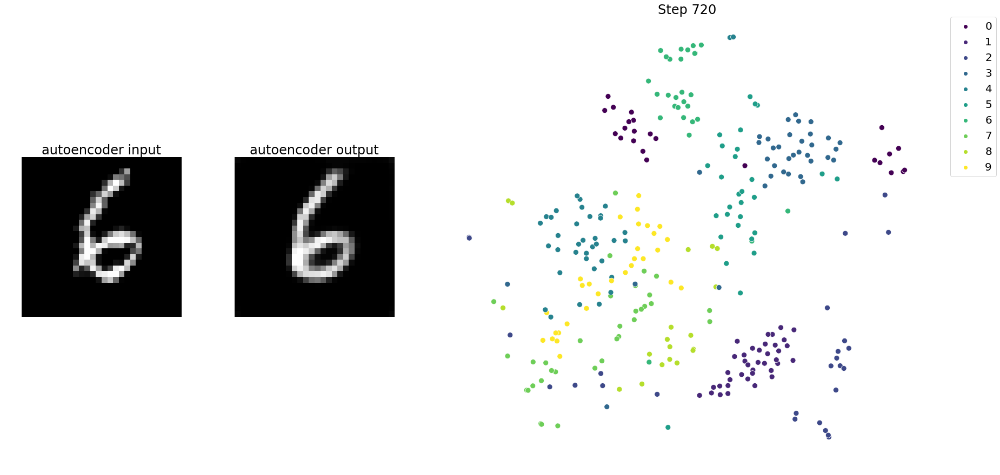

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.001s...
[t-SNE] Computed neighbors for 400 samples in 0.013s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 5.699368
[t-SNE] KL divergence after 250 iterations with early exaggeration: 64.390480
[t-SNE] KL divergence after 300 iterations: 0.781485


<Figure size 432x288 with 0 Axes>

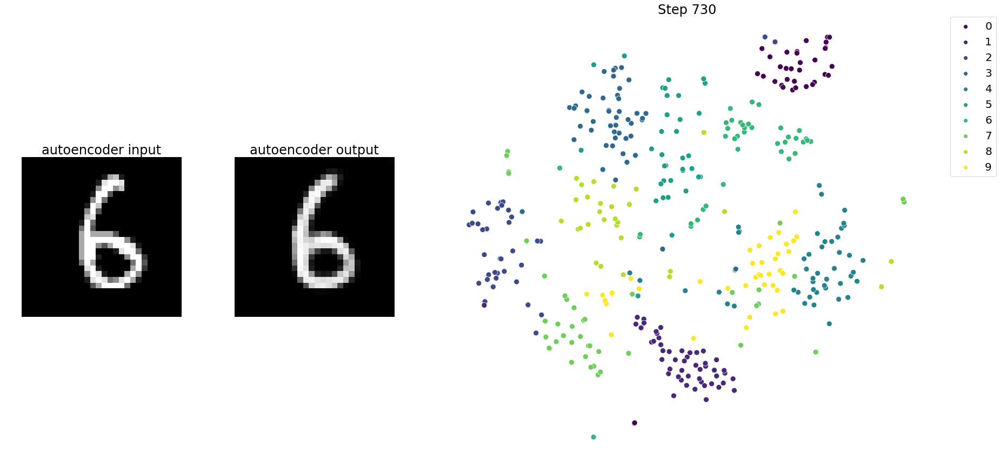

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 500 samples in 0.001s...
[t-SNE] Computed neighbors for 500 samples in 0.021s...
[t-SNE] Computed conditional probabilities for sample 500 / 500
[t-SNE] Mean sigma: 5.328419
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.783745
[t-SNE] KL divergence after 300 iterations: 0.927385


<Figure size 432x288 with 0 Axes>

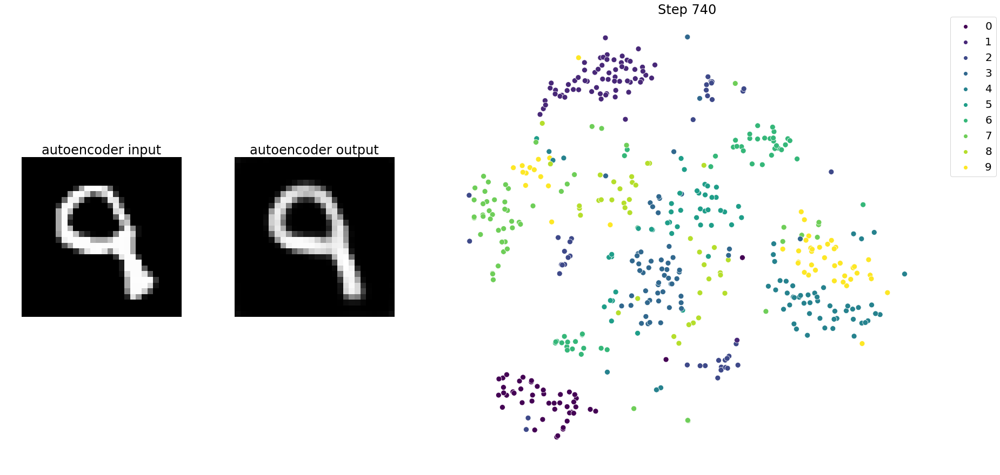

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 600 samples in 0.001s...
[t-SNE] Computed neighbors for 600 samples in 0.027s...
[t-SNE] Computed conditional probabilities for sample 600 / 600
[t-SNE] Mean sigma: 5.479436
[t-SNE] KL divergence after 250 iterations with early exaggeration: 66.345909
[t-SNE] KL divergence after 300 iterations: 0.809318


<Figure size 432x288 with 0 Axes>

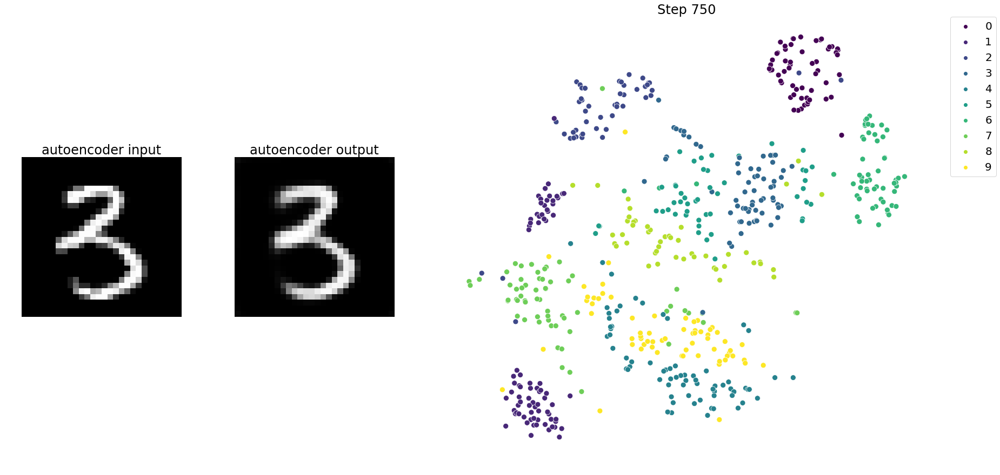

[t-SNE] Computing 99 nearest neighbors...
[t-SNE] Indexed 100 samples in 0.000s...
[t-SNE] Computed neighbors for 100 samples in 0.002s...
[t-SNE] Computed conditional probabilities for sample 100 / 100
[t-SNE] Mean sigma: 9.660814
[t-SNE] KL divergence after 250 iterations with early exaggeration: 51.361141
[t-SNE] KL divergence after 300 iterations: 0.515597


<Figure size 432x288 with 0 Axes>

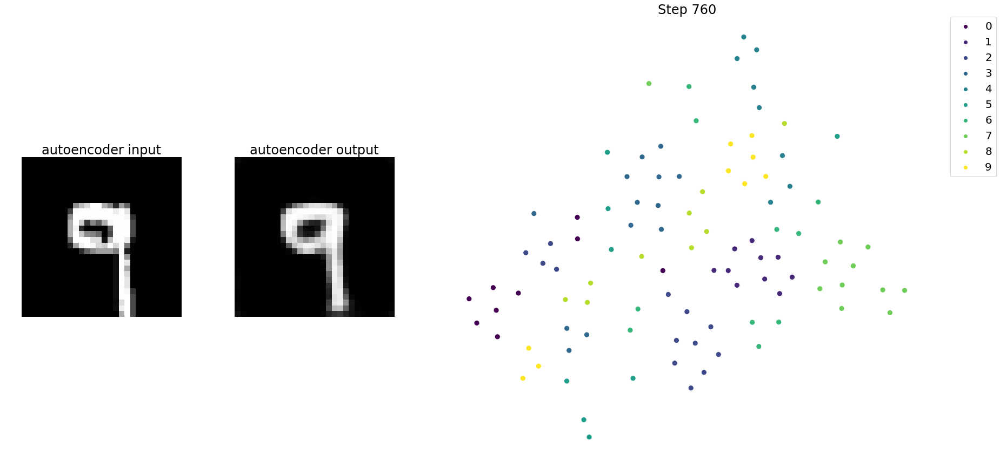

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 200 samples in 0.000s...
[t-SNE] Computed neighbors for 200 samples in 0.003s...
[t-SNE] Computed conditional probabilities for sample 200 / 200
[t-SNE] Mean sigma: 7.037166
[t-SNE] KL divergence after 250 iterations with early exaggeration: 57.858257
[t-SNE] KL divergence after 300 iterations: 0.590724


<Figure size 432x288 with 0 Axes>

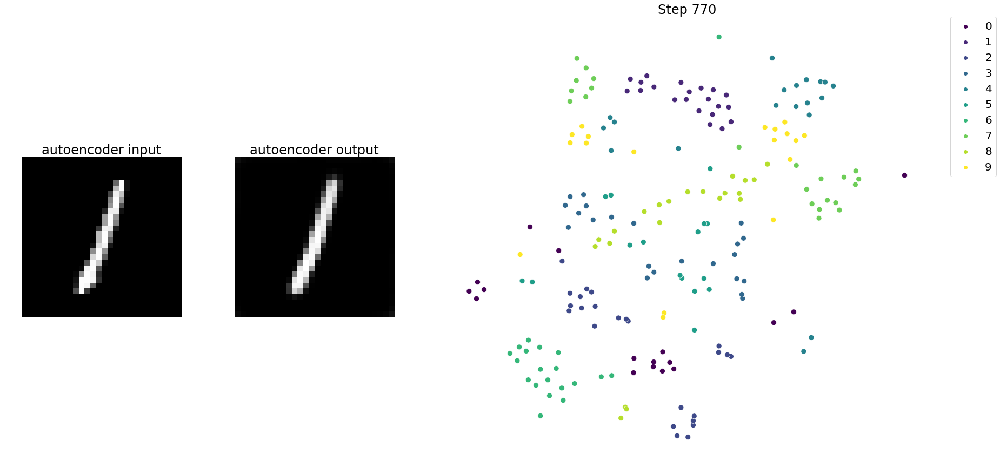

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 300 samples in 0.001s...
[t-SNE] Computed neighbors for 300 samples in 0.009s...
[t-SNE] Computed conditional probabilities for sample 300 / 300
[t-SNE] Mean sigma: 6.751261
[t-SNE] KL divergence after 250 iterations with early exaggeration: 61.945652
[t-SNE] KL divergence after 300 iterations: 0.741034


<Figure size 432x288 with 0 Axes>

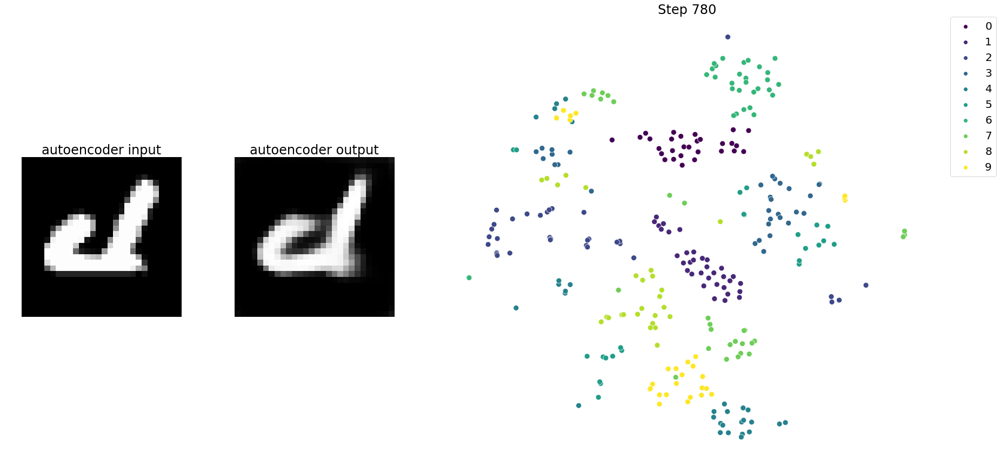

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.000s...
[t-SNE] Computed neighbors for 400 samples in 0.013s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 6.059586
[t-SNE] KL divergence after 250 iterations with early exaggeration: 64.271004
[t-SNE] KL divergence after 300 iterations: 0.733912


<Figure size 432x288 with 0 Axes>

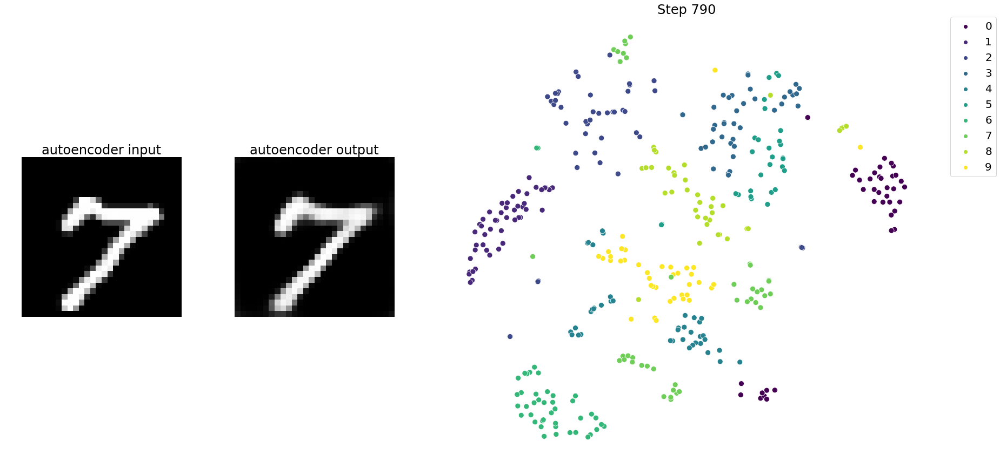

[t-SNE] Computing 99 nearest neighbors...
[t-SNE] Indexed 100 samples in 0.000s...
[t-SNE] Computed neighbors for 100 samples in 0.003s...
[t-SNE] Computed conditional probabilities for sample 100 / 100
[t-SNE] Mean sigma: 9.265503
[t-SNE] KL divergence after 250 iterations with early exaggeration: 51.085468
[t-SNE] KL divergence after 300 iterations: 0.580234


<Figure size 432x288 with 0 Axes>

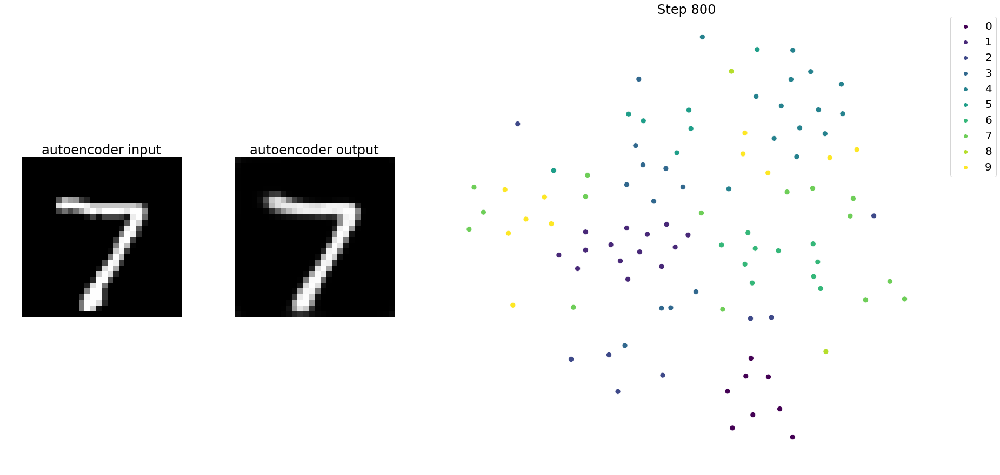

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 200 samples in 0.000s...
[t-SNE] Computed neighbors for 200 samples in 0.003s...
[t-SNE] Computed conditional probabilities for sample 200 / 200
[t-SNE] Mean sigma: 5.919421
[t-SNE] KL divergence after 250 iterations with early exaggeration: 59.662758
[t-SNE] KL divergence after 300 iterations: 0.845822


<Figure size 432x288 with 0 Axes>

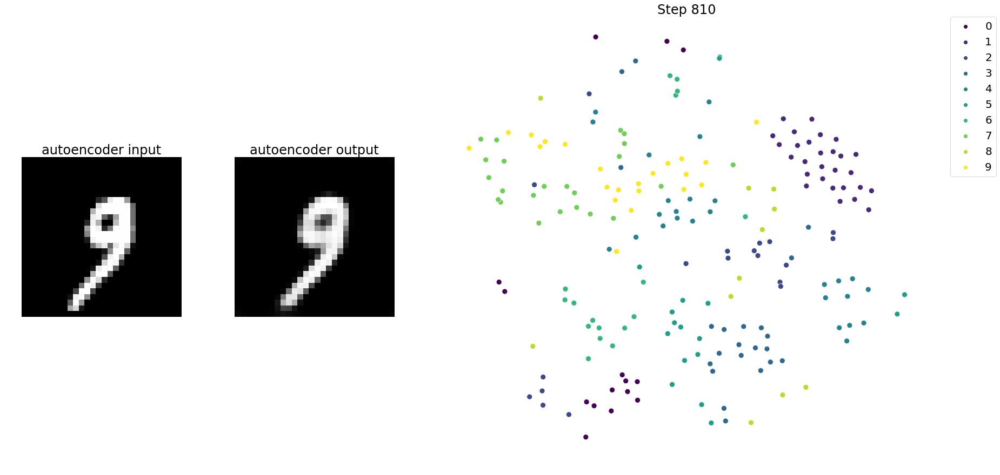

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 300 samples in 0.000s...
[t-SNE] Computed neighbors for 300 samples in 0.009s...
[t-SNE] Computed conditional probabilities for sample 300 / 300
[t-SNE] Mean sigma: 5.890422
[t-SNE] KL divergence after 250 iterations with early exaggeration: 62.599564
[t-SNE] KL divergence after 300 iterations: 1.011776


<Figure size 432x288 with 0 Axes>

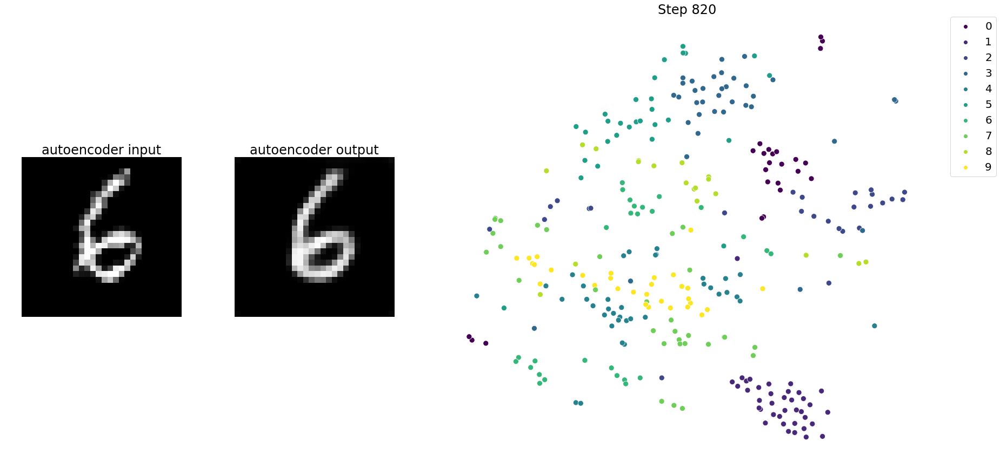

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.001s...
[t-SNE] Computed neighbors for 400 samples in 0.014s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 5.513612
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.541588
[t-SNE] KL divergence after 300 iterations: 0.924917


<Figure size 432x288 with 0 Axes>

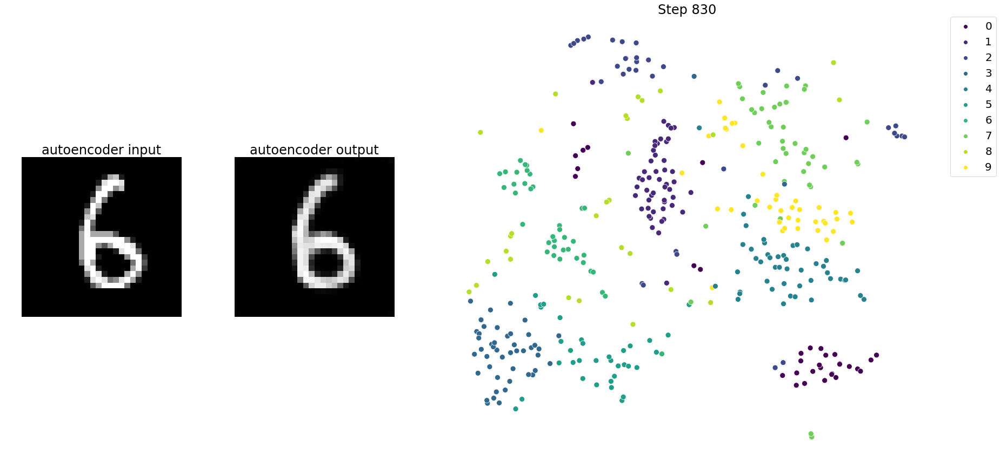

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 500 samples in 0.001s...
[t-SNE] Computed neighbors for 500 samples in 0.021s...
[t-SNE] Computed conditional probabilities for sample 500 / 500
[t-SNE] Mean sigma: 5.684968
[t-SNE] KL divergence after 250 iterations with early exaggeration: 66.260506
[t-SNE] KL divergence after 300 iterations: 0.836823


<Figure size 432x288 with 0 Axes>

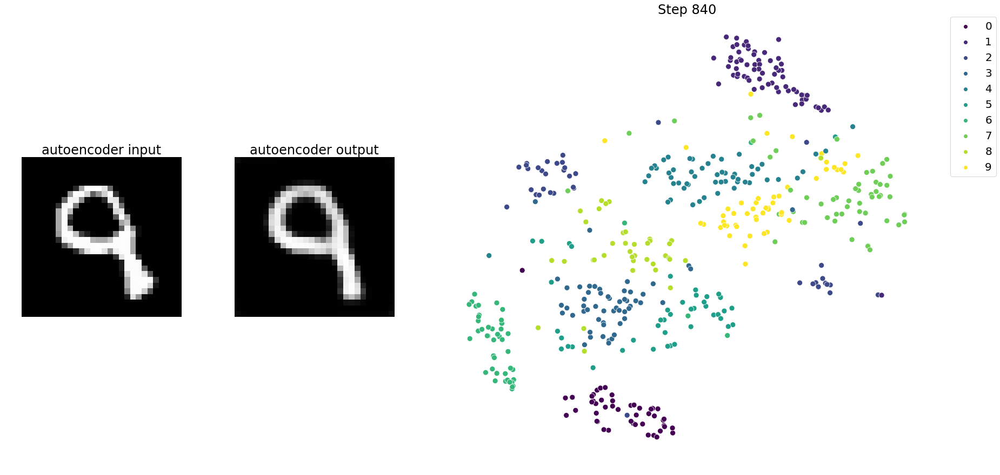

[t-SNE] Computing 99 nearest neighbors...
[t-SNE] Indexed 100 samples in 0.000s...
[t-SNE] Computed neighbors for 100 samples in 0.005s...
[t-SNE] Computed conditional probabilities for sample 100 / 100
[t-SNE] Mean sigma: 6.810518
[t-SNE] KL divergence after 250 iterations with early exaggeration: 52.470619
[t-SNE] KL divergence after 300 iterations: 0.539587


<Figure size 432x288 with 0 Axes>

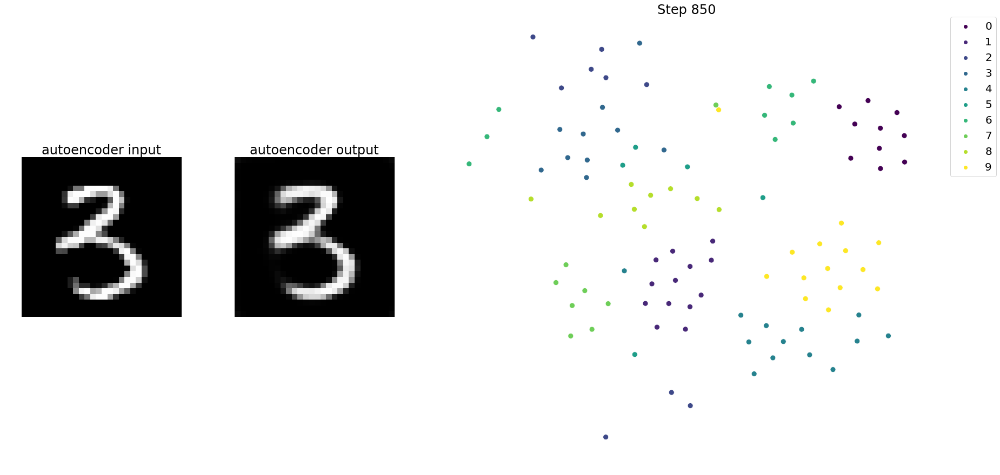

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 200 samples in 0.000s...
[t-SNE] Computed neighbors for 200 samples in 0.003s...
[t-SNE] Computed conditional probabilities for sample 200 / 200
[t-SNE] Mean sigma: 6.460318
[t-SNE] KL divergence after 250 iterations with early exaggeration: 59.199272
[t-SNE] KL divergence after 300 iterations: 0.600650


<Figure size 432x288 with 0 Axes>

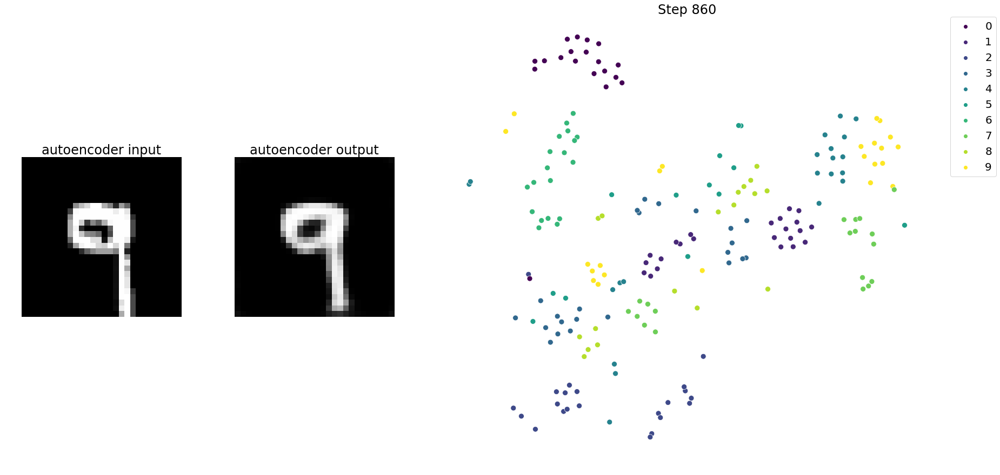

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 300 samples in 0.001s...
[t-SNE] Computed neighbors for 300 samples in 0.009s...
[t-SNE] Computed conditional probabilities for sample 300 / 300
[t-SNE] Mean sigma: 6.333418
[t-SNE] KL divergence after 250 iterations with early exaggeration: 62.087475
[t-SNE] KL divergence after 300 iterations: 0.492838


<Figure size 432x288 with 0 Axes>

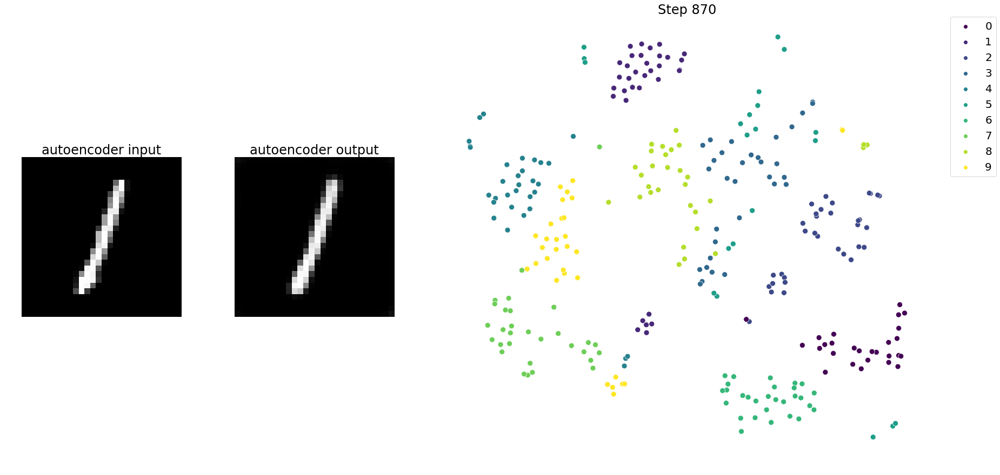

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.001s...
[t-SNE] Computed neighbors for 400 samples in 0.014s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 6.194782
[t-SNE] KL divergence after 250 iterations with early exaggeration: 62.739494
[t-SNE] KL divergence after 300 iterations: 0.561032


<Figure size 432x288 with 0 Axes>

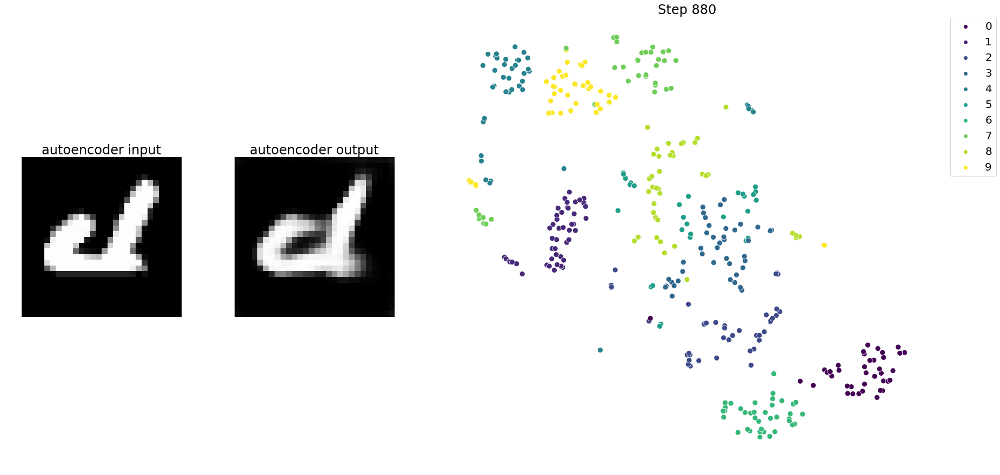

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 500 samples in 0.001s...
[t-SNE] Computed neighbors for 500 samples in 0.021s...
[t-SNE] Computed conditional probabilities for sample 500 / 500
[t-SNE] Mean sigma: 6.182553
[t-SNE] KL divergence after 250 iterations with early exaggeration: 64.823196
[t-SNE] KL divergence after 300 iterations: 0.634611


<Figure size 432x288 with 0 Axes>

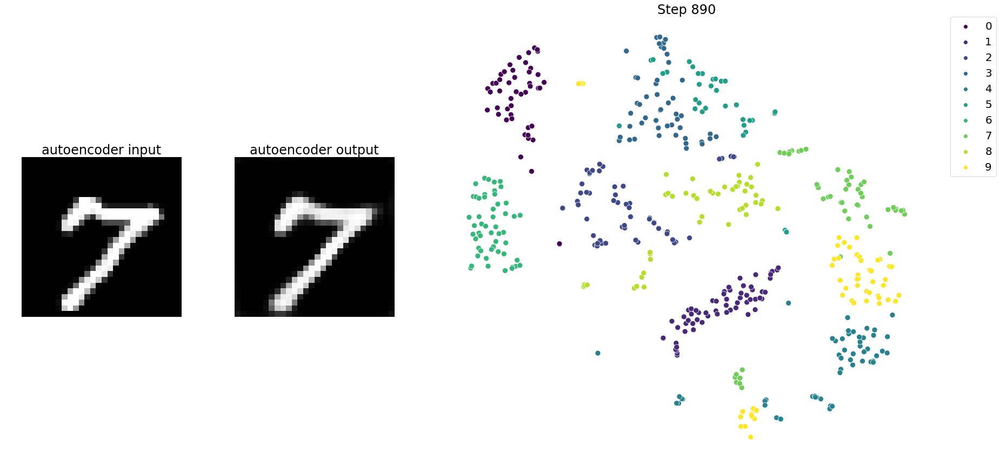

[t-SNE] Computing 99 nearest neighbors...
[t-SNE] Indexed 100 samples in 0.000s...
[t-SNE] Computed neighbors for 100 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 100 / 100
[t-SNE] Mean sigma: 9.255474
[t-SNE] KL divergence after 250 iterations with early exaggeration: 52.977882
[t-SNE] KL divergence after 300 iterations: 0.590434


<Figure size 432x288 with 0 Axes>

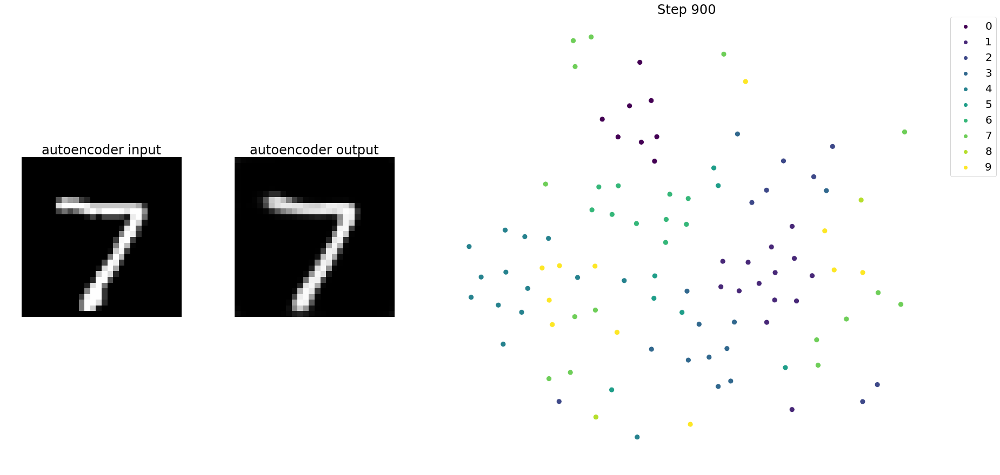

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 200 samples in 0.000s...
[t-SNE] Computed neighbors for 200 samples in 0.003s...
[t-SNE] Computed conditional probabilities for sample 200 / 200
[t-SNE] Mean sigma: 7.290598
[t-SNE] KL divergence after 250 iterations with early exaggeration: 56.926746
[t-SNE] KL divergence after 300 iterations: 0.670412


<Figure size 432x288 with 0 Axes>

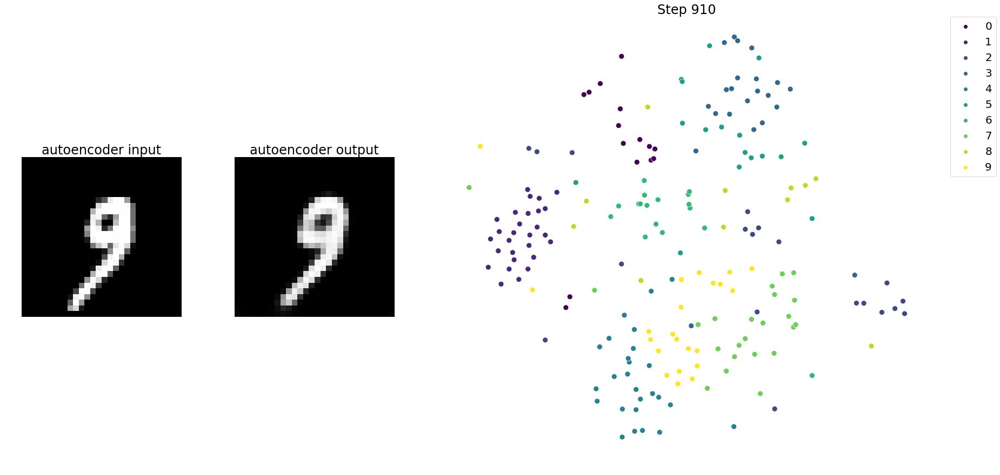

[t-SNE] Computing 99 nearest neighbors...
[t-SNE] Indexed 100 samples in 0.000s...
[t-SNE] Computed neighbors for 100 samples in 0.001s...
[t-SNE] Computed conditional probabilities for sample 100 / 100
[t-SNE] Mean sigma: 8.531901
[t-SNE] KL divergence after 250 iterations with early exaggeration: 51.403584
[t-SNE] KL divergence after 300 iterations: 0.670927


<Figure size 432x288 with 0 Axes>

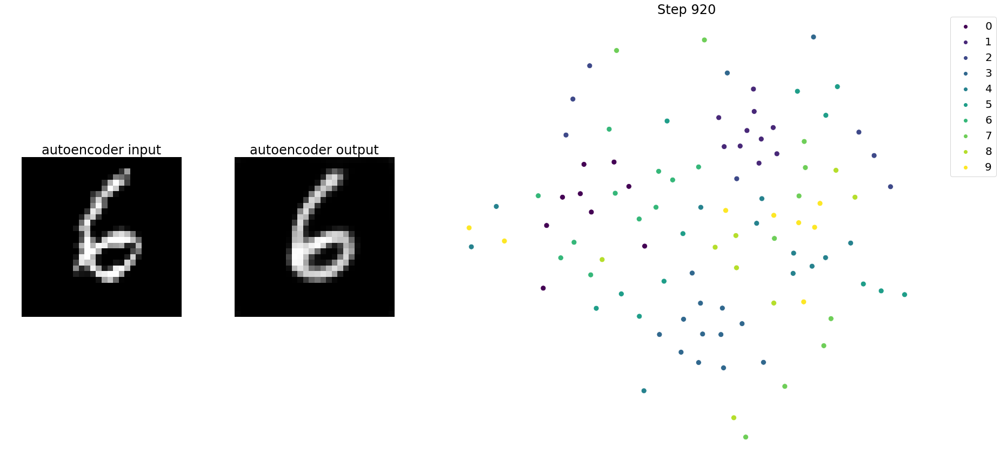

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 200 samples in 0.000s...
[t-SNE] Computed neighbors for 200 samples in 0.003s...
[t-SNE] Computed conditional probabilities for sample 200 / 200
[t-SNE] Mean sigma: 5.824432
[t-SNE] KL divergence after 250 iterations with early exaggeration: 60.929333
[t-SNE] KL divergence after 300 iterations: 0.942517


<Figure size 432x288 with 0 Axes>

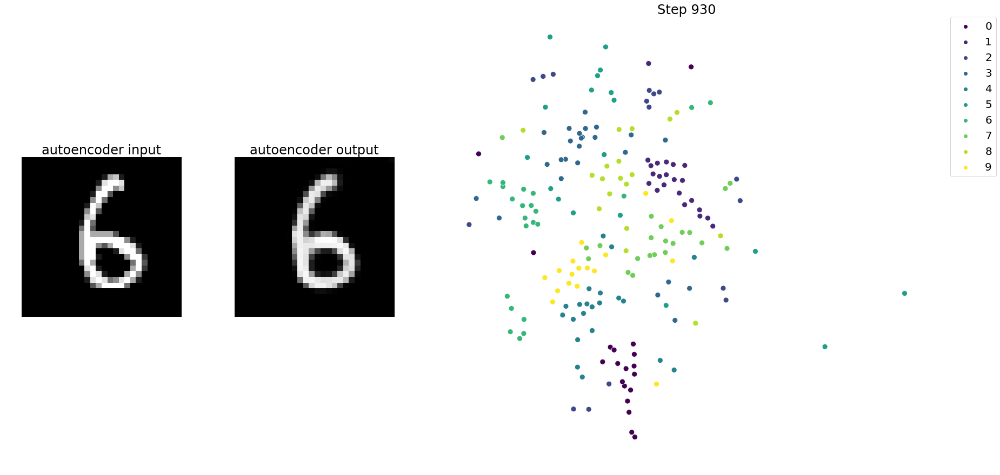

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 300 samples in 0.001s...
[t-SNE] Computed neighbors for 300 samples in 0.009s...
[t-SNE] Computed conditional probabilities for sample 300 / 300
[t-SNE] Mean sigma: 5.846813
[t-SNE] KL divergence after 250 iterations with early exaggeration: 62.069595
[t-SNE] KL divergence after 300 iterations: 0.793568


<Figure size 432x288 with 0 Axes>

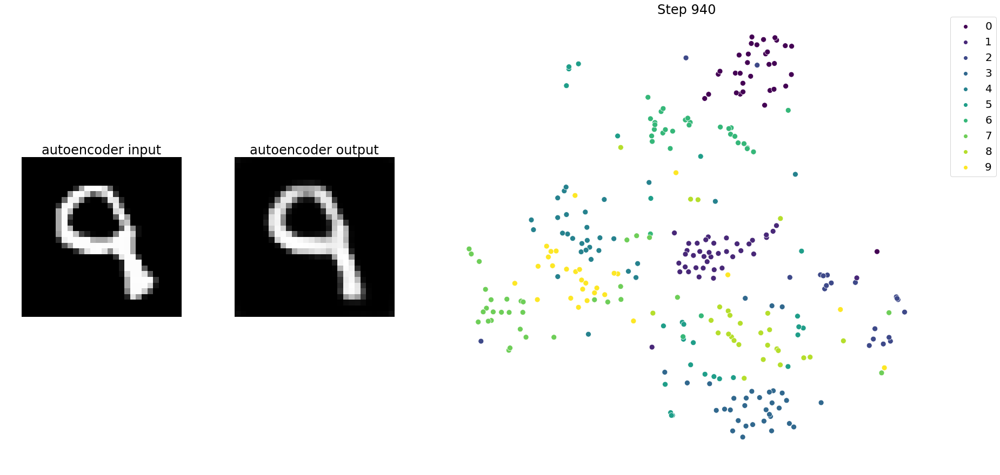

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.001s...
[t-SNE] Computed neighbors for 400 samples in 0.013s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 5.890513
[t-SNE] KL divergence after 250 iterations with early exaggeration: 64.627846
[t-SNE] KL divergence after 300 iterations: 0.818799


<Figure size 432x288 with 0 Axes>

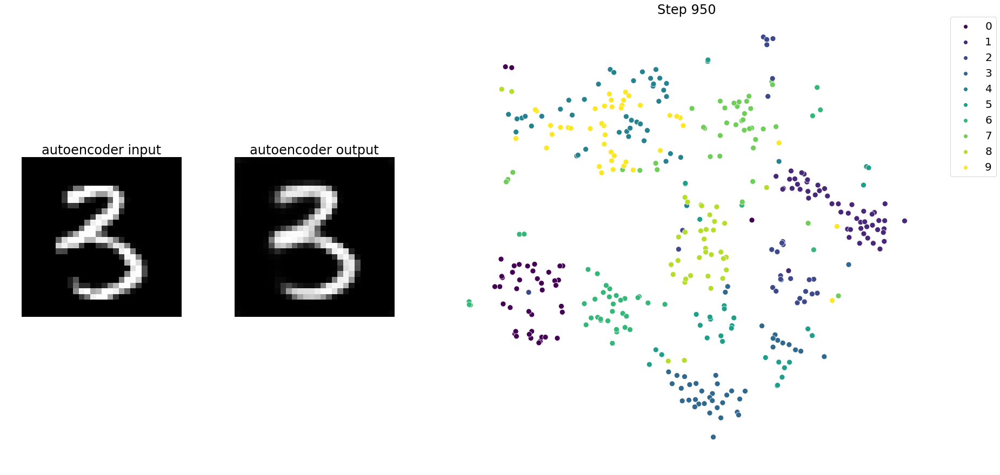

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 500 samples in 0.000s...
[t-SNE] Computed neighbors for 500 samples in 0.021s...
[t-SNE] Computed conditional probabilities for sample 500 / 500
[t-SNE] Mean sigma: 5.916648
[t-SNE] KL divergence after 250 iterations with early exaggeration: 66.544037
[t-SNE] KL divergence after 300 iterations: 0.861505


<Figure size 432x288 with 0 Axes>

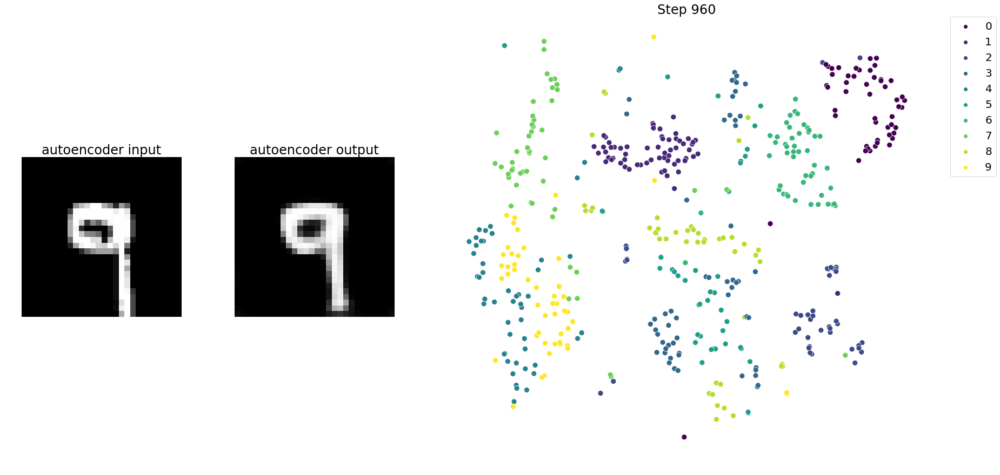

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 600 samples in 0.001s...
[t-SNE] Computed neighbors for 600 samples in 0.027s...
[t-SNE] Computed conditional probabilities for sample 600 / 600
[t-SNE] Mean sigma: 5.616160
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.691002
[t-SNE] KL divergence after 300 iterations: 0.762739


<Figure size 432x288 with 0 Axes>

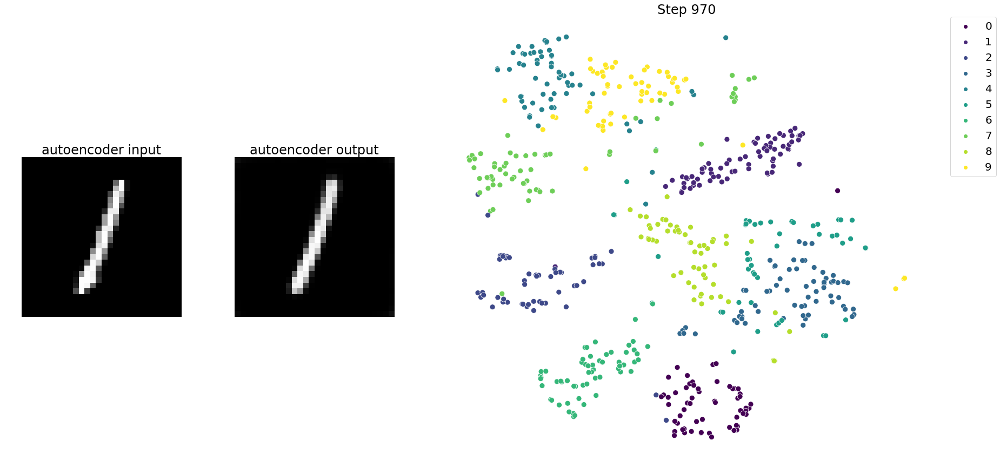

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 700 samples in 0.001s...
[t-SNE] Computed neighbors for 700 samples in 0.033s...
[t-SNE] Computed conditional probabilities for sample 700 / 700
[t-SNE] Mean sigma: 5.543296
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.663788
[t-SNE] KL divergence after 300 iterations: 0.835012


<Figure size 432x288 with 0 Axes>

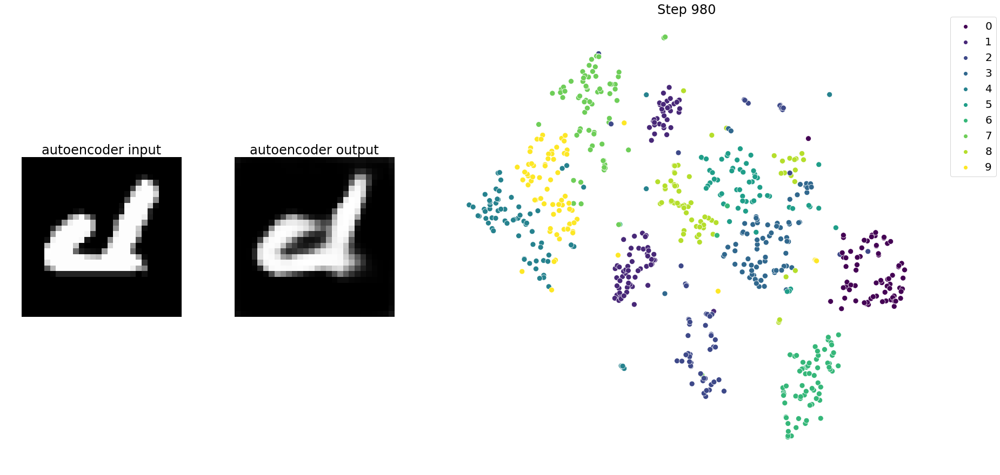

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 800 samples in 0.001s...
[t-SNE] Computed neighbors for 800 samples in 0.041s...
[t-SNE] Computed conditional probabilities for sample 800 / 800
[t-SNE] Mean sigma: 5.549751
[t-SNE] KL divergence after 250 iterations with early exaggeration: 64.941597
[t-SNE] KL divergence after 300 iterations: 0.835597


<Figure size 432x288 with 0 Axes>

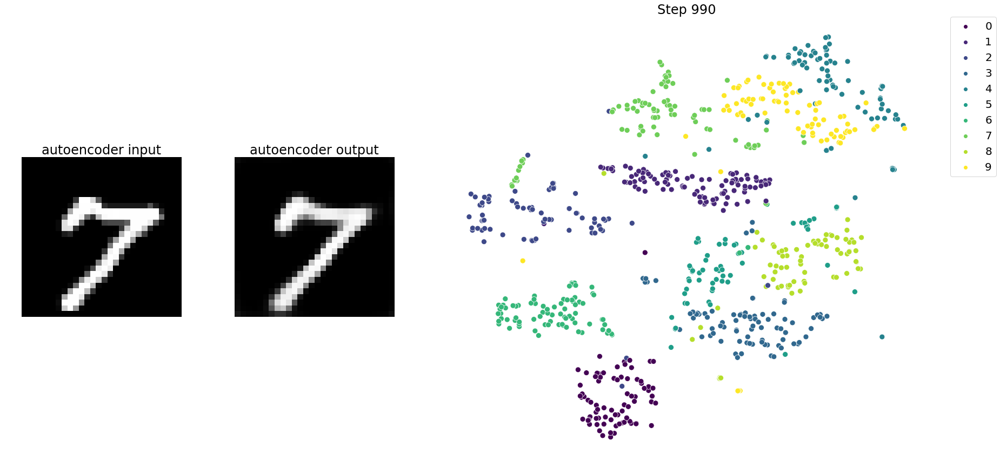

[2020-03-27 19:07:06.031 ip-10-10-41-69:24605 INFO trial.py:198] Training has ended, will refresh one final time in 1 sec.
[2020-03-27 19:07:07.048 ip-10-10-41-69:24605 INFO trial.py:210] Loaded all steps

Done


<Figure size 432x288 with 0 Axes>

In [13]:
from smdebug.exceptions import TensorUnavailableForStep
from smdebug.mxnet import modes

loaded_all_steps = False
while not loaded_all_steps:
    
    # get available steps
    loaded_all_steps = trial.loaded_all_steps
    steps = trial.steps(mode=modes.EVAL)
    
    # quick way to get diff between two lists
    steps_to_render = list(set(steps).symmetric_difference(set(rendered_steps)))
    
    tensors = []
    labels = []   
    
    #iterate over available steps
    for step in sorted(steps_to_render):
        try:
            if len(tensors) > 1000:
                tensors = []
                labels = []
                
            # get tensor from bottleneck layer and label
            tensor = trial.tensor(autoencoder_bottleneck).value(step_num=step, mode=modes.EVAL)
            label = trial.tensor(label_input).value(step_num=step, mode=modes.EVAL)
            for batch in range(tensor.shape[0]):
                tensors.append(tensor[batch,:])
                labels.append(label[batch])
                
            #compute tsne
            tsne_results = compute_tsne(tensors, labels)
            
            # get autoencoder input and output
            input_tensor = trial.tensor(autoencoder_input).value(step_num=step, mode=modes.EVAL)[0,0,:,:]
            output_tensor = trial.tensor(autoencoder_output).value(step_num=step, mode=modes.EVAL)[0,0,:,:]
          
            #plot results
            plot_autoencoder_data(tsne_results, input_tensor, output_tensor)

        except TensorUnavailableForStep:
            print("Tensor unavilable for step {}".format(step))
            
    rendered_steps.extend(steps_to_render)
    
    time.sleep(5)
    
print('\nDone')